# 577- Time Series
## Final Project - Version 2
### Evaluating Car Data
Naeem Sonia

Eric Maibach

## Load the data and look at it

In [2]:
source('https://nmimoto.github.io/R/TS-00.txt')

Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric


Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 



In [3]:
D <- read.csv("https://nmimoto.github.io/datasets/car.csv", header=T)
D

Month,Monthly.car.sales.in.Quebec.1960.1968
<fct>,<int>
1960-01,6550
1960-02,8728
1960-03,12026
1960-04,14395
1960-05,14587
1960-06,13791
1960-07,9498
1960-08,8251
1960-09,7049


## First try it without using seasonal

In [4]:
D0 <- ts(D[,2], start=c(1960,1), freq=1)

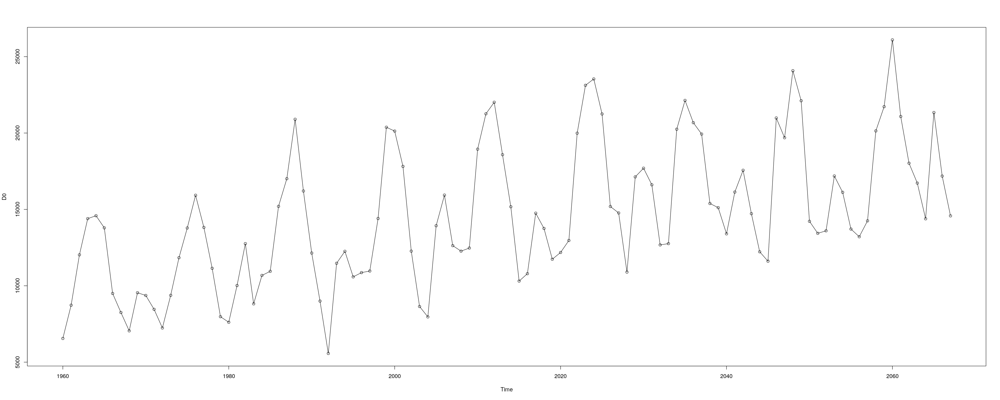

In [5]:
options(repr.plot.width=30, repr.plot.height=12)
plot(D0, type='o')

Looking at the graph, it appears that it is not stationary, but instead is gradually increasing.  It also appears that it may have a seasonal component.

In [6]:
Fit0 <- auto.arima(D0, stepwise = FALSE, approximation = FALSE)
Fit0

Series: D0 
ARIMA(2,1,2) with drift 

Coefficients:
         ar1      ar2      ma1     ma2    drift
      1.4951  -0.7798  -1.8793  0.9149  88.4266
s.e.  0.0882   0.0660   0.1211  0.1354  34.3670

sigma^2 estimated as 6759362:  log likelihood=-992.94
AIC=1997.88   AICc=1998.72   BIC=2013.92

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0,0,0,0.104,0.186,0.252,2538.404


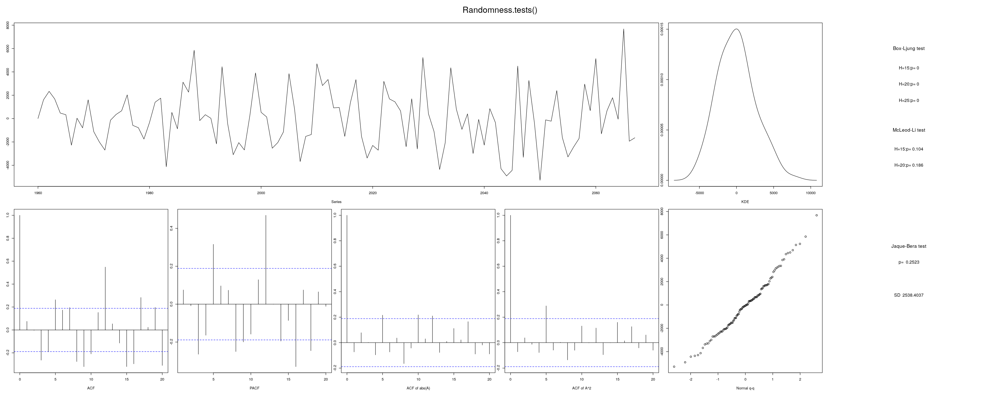

In [7]:
Randomness.tests(Fit0$residuals)

ACF and PACF graphs are showing a lot of correlation at higher lags, especially lag 12, indicating the data is seasonal.  The Box-Ljung numbers are all 0 confirming that there is still a lot of correlation.  Jaque-Bera number is high, indicating the errors follow a normal distribution.

### Try forcing auto.arima() to look at higher p and q values

In [10]:
Fit00 <- auto.arima(D0, stepwise = FALSE, approximation = FALSE, max.p = 15, max.q = 15)
Fit00

Series: D0 
ARIMA(2,1,2) with drift 

Coefficients:
         ar1      ar2      ma1     ma2    drift
      1.4951  -0.7798  -1.8793  0.9149  88.4266
s.e.  0.0882   0.0660   0.1211  0.1354  34.3670

sigma^2 estimated as 6759362:  log likelihood=-992.94
AIC=1997.88   AICc=1998.72   BIC=2013.92

It returned the same model

### Try manually forcing higher p and q values

In [11]:
Fit01 <- Arima(D0, order=c(15,1,15), include.drift = TRUE)
Fit01

Series: D0 
ARIMA(15,1,15) with drift 

Coefficients:
          ar1      ar2     ar3      ar4     ar5      ar6     ar7      ar8
      -0.2947  -0.1726  0.1355  -0.3611  0.1053  -0.0879  0.0240  -0.1833
s.e.   0.2530   0.3168  0.2687   0.1707  0.1712   0.1586  0.1464   0.1459
          ar9     ar10    ar11    ar12   ar13    ar14     ar15      ma1
      -0.1507  -0.0508  0.2105  0.5634  0.204  0.3133  -0.1437  -0.3514
s.e.   0.1451   0.1675  0.1620  0.1604  0.235  0.1999   0.1830   0.2588
          ma2      ma3     ma4      ma5      ma6      ma7    ma8     ma9
      -0.1185  -0.3275  0.4082  -0.3715  -0.1053  -0.1957  0.072  0.3759
s.e.   0.2005   0.2768  0.2222   0.1988   0.1708   0.1776  0.209  0.1832
         ma10    ma11     ma12    ma13     ma14    ma15    drift
      -0.4133  0.1756  -0.2260  0.1007  -0.6047  0.5821  83.2536
s.e.   0.1972  0.1924   0.2193  0.1525   0.2084  0.1785   9.8038

sigma^2 estimated as 1880156:  log likelihood=-923.18
AIC=1910.35   AICc=1938.89   BIC=1995.8

ar15, ar14 are not significant, remove them.

In [12]:
Fit01 <- Arima(D0, order=c(13,1,15), include.drift = TRUE)
Fit01

Warning message in sqrt(diag(x$var.coef)):
“NaNs produced”


Series: D0 
ARIMA(13,1,15) with drift 

Coefficients:
          ar1     ar2     ar3      ar4     ar5     ar6      ar7      ar8
      -1.0016  0.0160  0.1483  -0.1399  0.0378  0.1139  -0.1053  -0.0324
s.e.   0.0780  0.0305  0.0352   0.0370  0.0339  0.0337   0.0438   0.0254
         ar9     ar10    ar11    ar12    ar13     ma1      ma2      ma3     ma4
      0.1156  -0.1483  0.0285  1.0710  0.8883  0.4377  -0.7981  -0.4537  0.2449
s.e.  0.0461   0.0245  0.0401  0.0343  0.0732  0.1543   0.0520   0.1977     NaN
          ma5      ma6     ma7      ma8      ma9    ma10    ma11     ma12
      -0.0268  -0.3350  0.0229  -0.0847  -0.0131  0.3014  0.1664  -0.8742
s.e.   0.1343   0.0932  0.1611   0.0982   0.1636  0.1113  0.1613   0.1195
         ma13    ma14    ma15    drift
      -0.3929  0.5683  0.2370  81.1101
s.e.   0.1804  0.1231  0.1347  18.5953

sigma^2 estimated as 1898195:  log likelihood=-923.27
AIC=1906.54   AICc=1931.01   BIC=1986.72

ma15 is not significant, remove it

In [13]:
Fit01 <- Arima(D0, order=c(13,1,14), include.drift = TRUE)
Fit01

Warning message in sqrt(diag(x$var.coef)):
“NaNs produced”


Series: D0 
ARIMA(13,1,14) with drift 

Coefficients:
          ar1      ar2     ar3      ar4      ar5      ar6     ar7      ar8
      -0.9866  -0.1405  0.3419  -0.2758  -0.5272  -0.1869  0.2136  -0.1290
s.e.      NaN   0.3990  0.4004   0.1752   0.2475   0.4128  0.3996   0.2054
          ar9     ar10    ar11    ar12    ar13     ma1      ma2      ma3
      -0.5919  -0.3199  0.3713  0.8083  0.2867  0.3534  -0.6408  -0.6625
s.e.   0.2627   0.3906  0.4168  0.1237     NaN     NaN   0.3364      NaN
         ma4     ma5      ma6      ma7      ma8     ma9    ma10     ma11
      0.4214  0.4973  -0.3209  -0.8282  -0.0531  0.9942  0.0408  -0.6538
s.e.  0.1548     NaN   0.2596      NaN      NaN  0.2345     NaN   0.2646
         ma12    ma13    ma14    drift
      -0.5375  0.3009  0.0915  82.7543
s.e.      NaN  0.3790  0.0923   9.1302

sigma^2 estimated as 1948859:  log likelihood=-926.11
AIC=1910.22   AICc=1932.82   BIC=1987.73

ma14 and ma13 are not significant, remove them

In [15]:
Fit01 <- Arima(D0, order=c(13,1,12), include.drift = TRUE)
Fit01

Warning message in sqrt(diag(x$var.coef)):
“NaNs produced”


Series: D0 
ARIMA(13,1,12) with drift 

Coefficients:
          ar1      ar2     ar3      ar4      ar5      ar6      ar7      ar8
      -0.9523  -0.0189  0.0557  -0.5172  -0.3470  -0.0713  -0.1162  -0.3190
s.e.   0.1306   0.2146  0.1927   0.1763   0.2453   0.2513   0.1860   0.2199
          ar9     ar10    ar11    ar12    ar13     ma1      ma2      ma3
      -0.4163  -0.2563  0.0942  0.6166  0.3791  0.2819  -0.8110  -0.1800
s.e.   0.1734   0.2297  0.1252  0.1496  0.0941  0.1668   0.0885   0.2855
         ma4      ma5      ma6      ma7     ma8     ma9     ma10     ma11
      0.6648  -0.0283  -0.5545  -0.2454  0.1664  0.4882  -0.1942  -0.3119
s.e.  0.2643   0.2874   0.3612   0.2138  0.3602  0.0969   0.2466      NaN
         ma12    drift
      -0.2665  82.7752
s.e.   0.0638   8.6350

sigma^2 estimated as 1952163:  log likelihood=-926.43
AIC=1906.86   AICc=1926   BIC=1979.03

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.993,0.886,0.903,0.55,0.61,0.725,1213.218


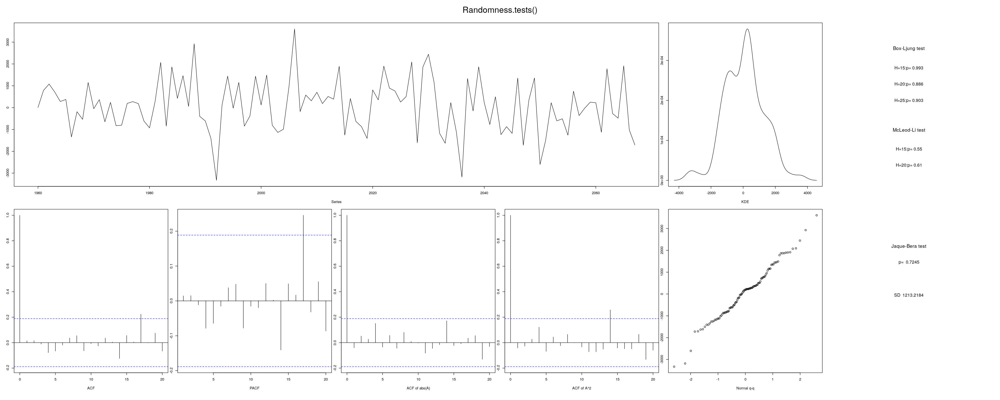

In [16]:
Randomness.tests(Fit01$residuals)

Residuals look good

MA's look weird, and a lot are not significant...try removing

In [298]:
Fit01 <- Arima(D0, order=c(12,1,0), include.drift = TRUE)
Fit01

Series: D0 
ARIMA(12,1,0) with drift 

Coefficients:
          ar1      ar2      ar3      ar4      ar5      ar6      ar7      ar8
      -0.6827  -0.5204  -0.6091  -0.7056  -0.5459  -0.6171  -0.5715  -0.6228
s.e.   0.0967   0.1120   0.1024   0.1006   0.1069   0.1034   0.1043   0.1045
          ar9     ar10     ar11    ar12    drift
      -0.6416  -0.6909  -0.3843  0.1714  83.0277
s.e.   0.1007   0.1016   0.1117  0.0982  20.0965

sigma^2 estimated as 2455321:  log likelihood=-938.44
AIC=1904.88   AICc=1909.45   BIC=1942.3

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.779,0.068,0.158,0.545,0.249,0.951,1468.468


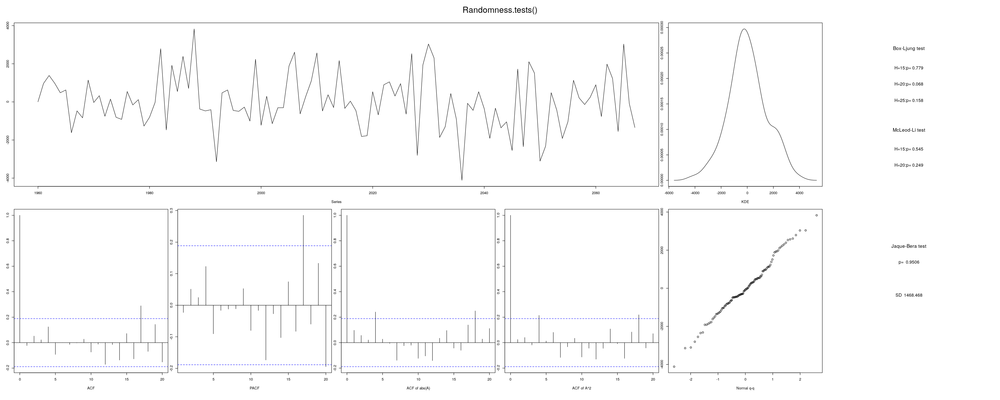

In [278]:
Randomness.tests(Fit01$residuals)

AICc is lower, residuals still look good.  Althought there is still correlation at lag 17.  

Lets test it and see how it performs

In [279]:
forecast1 <- forecast(Fit01, 12)
forecast1

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2068       13716.79 11708.67 15724.91 10645.63 16787.95
2069       14865.74 12758.96 16972.52 11643.69 18087.78
2070       20556.67 18384.70 22728.63 17234.94 23878.40
2071       23194.42 21020.47 25368.37 19869.65 26519.19
2072       26050.69 23872.54 28228.83 22719.51 29381.87
2073       21904.23 19718.28 24090.18 18561.10 25247.36
2074       19353.11 17166.22 21539.99 16008.55 22697.66
2075       17103.63 14912.06 19295.20 13751.91 20455.35
2076       17492.11 15299.58 19684.64 14138.92 20845.30
2077       21480.83 19286.69 23674.97 18125.18 24836.48
2078       17934.96 15736.44 20133.47 14572.62 21297.29
2079       16362.24 14113.12 18611.35 12922.51 19801.96

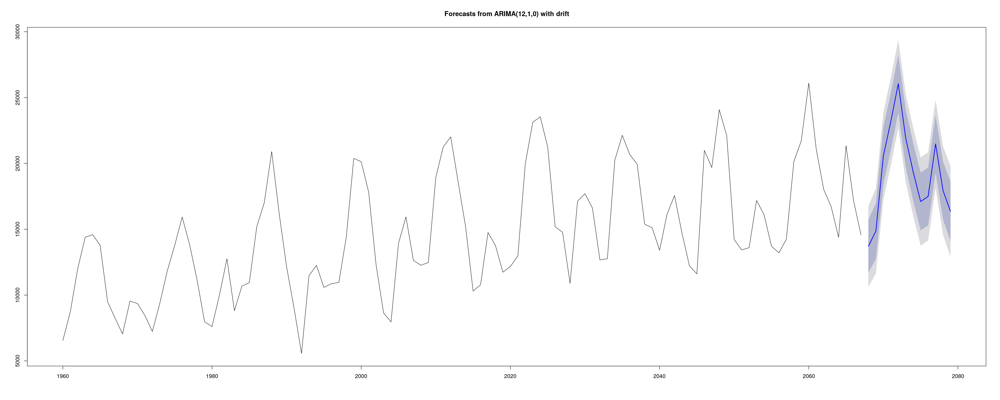

In [280]:
plot(forecast1)

    i= 1   MLE-CSS failed.  Using CSS.
    i= 2   MLE-CSS failed.  Using CSS.
    i= 7   MLE-CSS failed.  Using CSS.
    i= 8   MLE-CSS failed.  Using CSS.
    i= 12   MLE-CSS failed.  Using CSS.
    i= 13   MLE-CSS failed.  Using CSS.
    i= 14   MLE-CSS failed.  Using CSS.
    i= 15   MLE-CSS failed.  Using CSS.
    i= 16   MLE-CSS failed.  Using CSS.

Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  -305.5207
  root Mean Squared Error:   1827.5207 




mean pred error,rMSE
-305.5207,1827.521


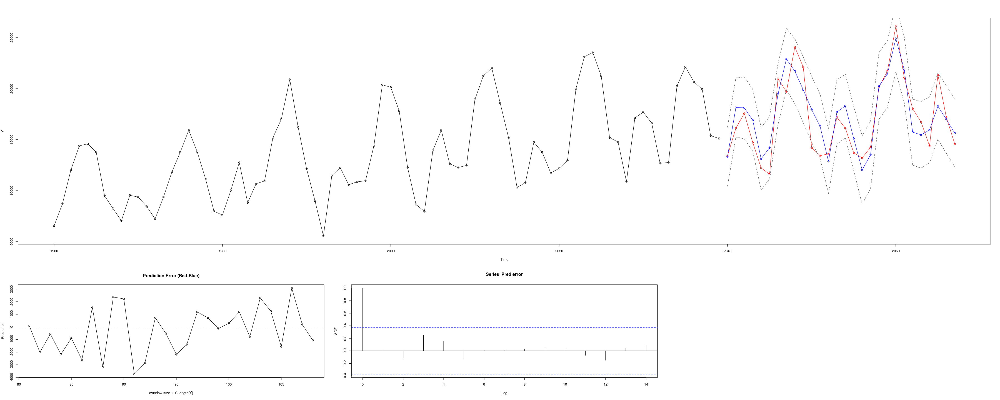

In [327]:
Y <- D0
window.size <- 80
Arima.order <- c(12,1,0)
pred.plot <- TRUE
include.mean = TRUE
include.drift = TRUE
lambda = NULL
xreg = FALSE
seasonal = c(0,0,0)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

95% CI of next prediction is 10,645.63 to 16,787.95.

rMSE is 1,827.52 is somewhat close to the sigma value of 1,566.95

Try adding parameters to capture correlation at lag 17.

In [281]:
Fit01 <- Arima(D0, order=c(17,1,0), method = "CSS", include.drift = TRUE)
Fit01

Series: D0 
ARIMA(17,1,0) with drift 

Coefficients:
          ar1      ar2      ar3      ar4      ar5      ar6      ar7      ar8
      -0.6123  -0.4658  -0.4956  -0.4769  -0.4734  -0.5716  -0.4162  -0.5127
s.e.   0.0949   0.1109   0.1200   0.1288   0.1363   0.1422   0.1516   0.1475
          ar9     ar10     ar11    ar12    ar13    ar14    ar15     ar16
      -0.4789  -0.5814  -0.2312  0.2918  0.1329  0.0809  0.0306  -0.1941
s.e.   0.1489   0.1483   0.1535  0.1454  0.1401  0.1337  0.1240   0.1159
        ar17    drift
      0.2183  86.3831
s.e.  0.1006  23.8427

sigma^2 estimated as 2014661:  part log likelihood=-927.83

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.799,0.777,0.914,0.733,0.682,0.265,1294.506


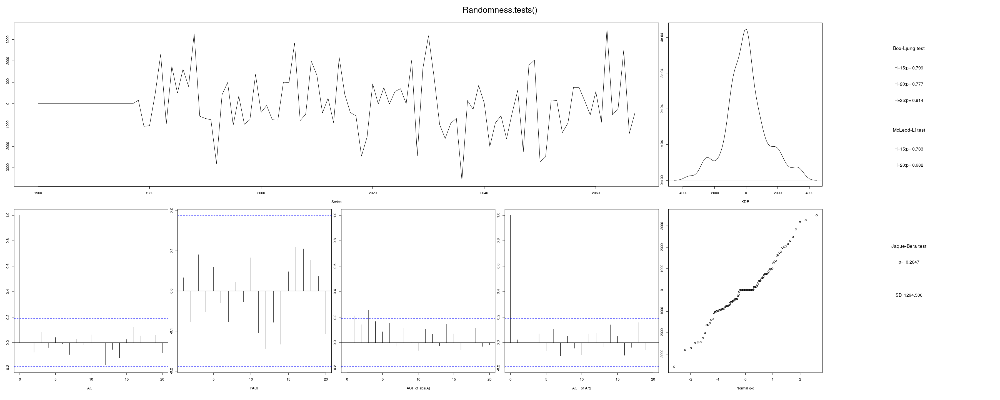

In [282]:
Randomness.tests(Fit01$residuals)

Residuals still look good, and we have gotten rid of the correlation at lag 17.
Because we had to use CSS method we don't have AICc, but sigma squared has decreased.

Test the model

In [283]:
forecast1 <- forecast(Fit01, 12)
forecast1

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2068       13413.04 11594.02 15232.06 10631.09 16194.99
2069       15246.18 13295.25 17197.10 12262.49 18229.86
2070       20816.44 18792.16 22840.72 17720.57 23912.31
2071       23419.14 21378.43 25459.85 20298.15 26540.14
2072       26418.49 24368.73 28468.24 23283.66 29553.31
2073       22134.37 20081.34 24187.39 18994.53 25274.20
2074       19181.78 17126.29 21237.27 16038.18 22325.38
2075       17297.41 15232.94 19361.88 14140.08 20454.75
2076       16733.41 14668.12 18798.70 13574.82 19892.00
2077       22276.40 20210.14 24342.67 19116.33 25436.48
2078       17739.14 15664.65 19813.64 14566.48 20911.81
2079       16172.96 14034.47 18311.44 12902.42 19443.49

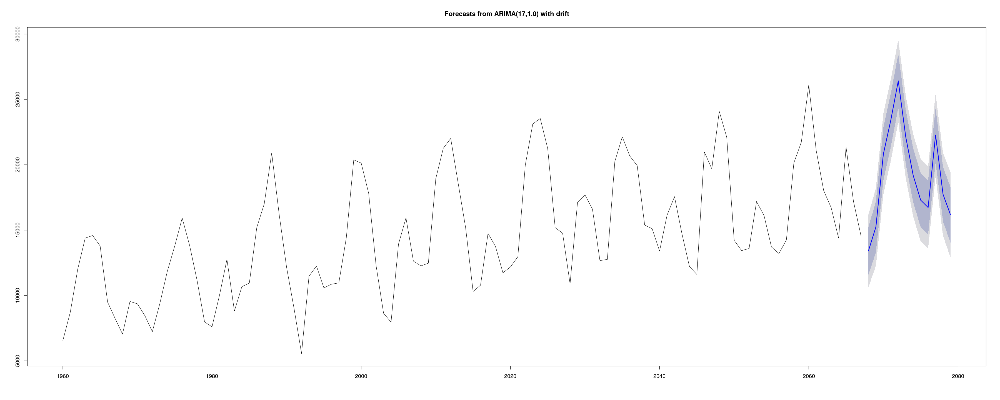

In [284]:
plot(forecast1)

    i= 1   MLE-CSS failed.  Using CSS.
    i= 2   MLE-CSS failed.  Using CSS.
    i= 3   MLE-CSS failed.  Using CSS.
    i= 4   MLE-CSS failed.  Using CSS.
    i= 5   MLE-CSS failed.  Using CSS.
    i= 6   MLE-CSS failed.  Using CSS.
    i= 7   MLE-CSS failed.  Using CSS.
    i= 8   MLE-CSS failed.  Using CSS.
    i= 9   MLE-CSS failed.  Using CSS.
    i= 10   MLE-CSS failed.  Using CSS.
    i= 11   MLE-CSS failed.  Using CSS.
    i= 12   MLE-CSS failed.  Using CSS.
    i= 13   MLE-CSS failed.  Using CSS.
    i= 14   MLE-CSS failed.  Using CSS.
    i= 15   MLE-CSS failed.  Using CSS.
    i= 16   MLE-CSS failed.  Using CSS.
    i= 17   MLE-CSS failed.  Using CSS.
    i= 18   MLE-CSS failed.  Using CSS.
    i= 19   MLE-CSS failed.  Using CSS.
    i= 20   MLE-CSS failed.  Using CSS.
    i= 21   MLE-CSS failed.  Using CSS.
    i= 22   MLE-CSS failed.  Using CSS.
    i= 23   MLE-CSS failed.  Using CSS.
    i= 28   MLE-CSS failed.  Using CSS.

Last  28  obs fit retrospectively
    with Rolli

mean pred error,rMSE
-261.9951,1911.676


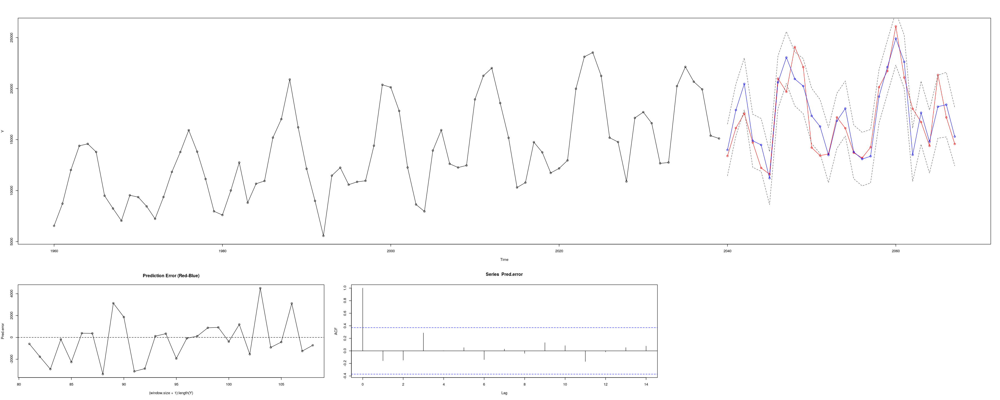

In [328]:
Y <- D0
window.size <- 80
Arima.order <- c(17,1,0)
pred.plot <- TRUE
include.mean = TRUE
include.drift = TRUE
lambda = NULL
xreg = FALSE
seasonal = c(0,0,0)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

95% CI is 10631.09 to 16194.99

rMSE is 1,911.676 which is not real close to the sigma value of 1,419.39

The rMSE value increased, and moved further away from the sigma.  This model seems to be performing worse than the ARIMA(12,1,0) with drift model.

We have a number of parameters that are not significant, try manually removing them

In [288]:
Fit01 <- Arima(D0, order=c(17,1,0), include.drift = TRUE, method = "CSS", fixed=c(NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,0,0,0,NA,NA,NA))
Fit01

Series: D0 
ARIMA(17,1,0) with drift 

Coefficients:
          ar1      ar2      ar3      ar4      ar5      ar6      ar7      ar8
      -0.5962  -0.4742  -0.5547  -0.5466  -0.5483  -0.6617  -0.5121  -0.6061
s.e.   0.0937   0.1030   0.0949   0.1076   0.1118   0.0962   0.1003   0.0991
          ar9     ar10     ar11    ar12  ar13  ar14  ar15     ar16    ar17
      -0.5772  -0.6813  -0.3219  0.1948     0     0     0  -0.2306  0.1960
s.e.   0.0972   0.0965   0.1069  0.0918     0     0     0   0.0857  0.0915
        drift
      85.3830
s.e.  19.8582

sigma^2 estimated as 1967721:  part log likelihood=-928.34

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.768,0.783,0.917,0.758,0.692,0.085,1300.72


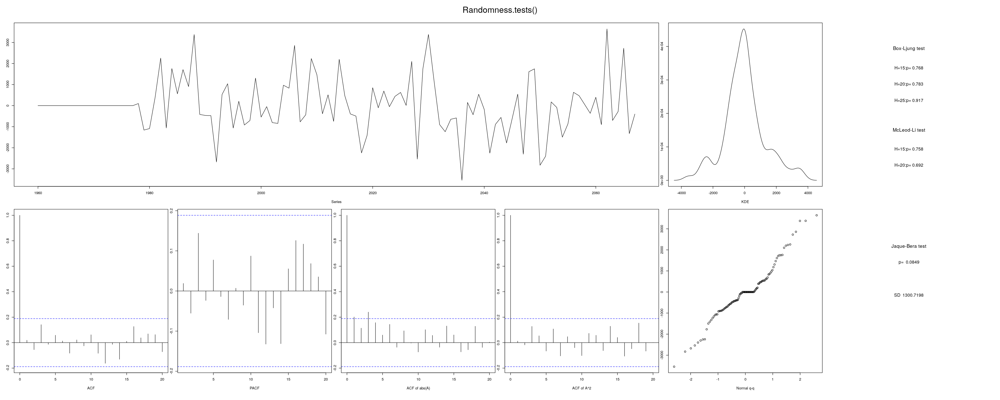

In [287]:
Randomness.tests(Fit01$residuals)

Residuals still look good, sigma squared has decreased.

### Try with linear trend

In [21]:
Fit02 <- auto.arima(D0, d=0, D=0, xreg=time(D0), stepwise=FALSE, approximation=FALSE, max.p = 17, max.q = 17)
Fit02

Series: D0 
Regression with ARIMA(3,0,2) errors 

Coefficients:
         ar1      ar2     ar3      ma1     ma2   intercept     xreg
      1.4060  -1.3714  0.4332  -0.6776  0.9391  -142452.99  77.9589
s.e.  0.1019   0.1098  0.0984   0.0473  0.0435    32581.13  16.1795

sigma^2 estimated as 5481379:  log likelihood=-989.67
AIC=1995.35   AICc=1996.8   BIC=2016.8

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0,0,0,0.006,0,0.46,2274.64


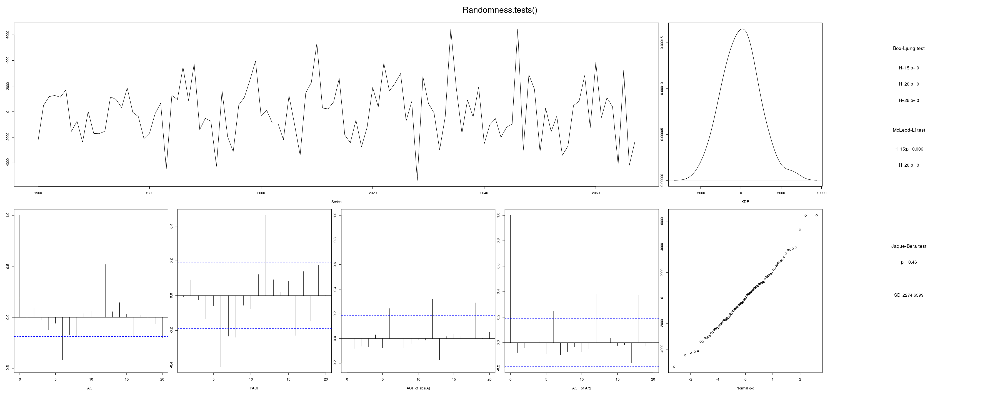

In [22]:
Randomness.tests(Fit02$residuals)

Residuals look pretty bad

### Try linear trend and manually forcing higher p and q values

In [300]:
Fit02 <- Arima(D0, order=c(12,0,0), include.drift=FALSE,  xreg=time(D0))
Fit02

Series: D0 
Regression with ARIMA(12,0,0) errors 

Coefficients:
         ar1     ar2      ar3      ar4     ar5      ar6     ar7      ar8
      0.1973  0.0824  -0.1057  -0.1222  0.1436  -0.1054  0.0315  -0.1020
s.e.  0.0838  0.0810   0.0826   0.0843  0.0850   0.0833  0.0854   0.0847
          ar9     ar10    ar11    ar12   intercept     xreg
      -0.0337  -0.0616  0.2633  0.4911  -153321.03  83.3222
s.e.   0.0853   0.0840  0.0840  0.0841    17690.67   8.7844

sigma^2 estimated as 2500814:  log likelihood=-946.73
AIC=1923.45   AICc=1928.67   BIC=1963.68

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.693,0.12,0.238,0.452,0.298,0.638,1481.579


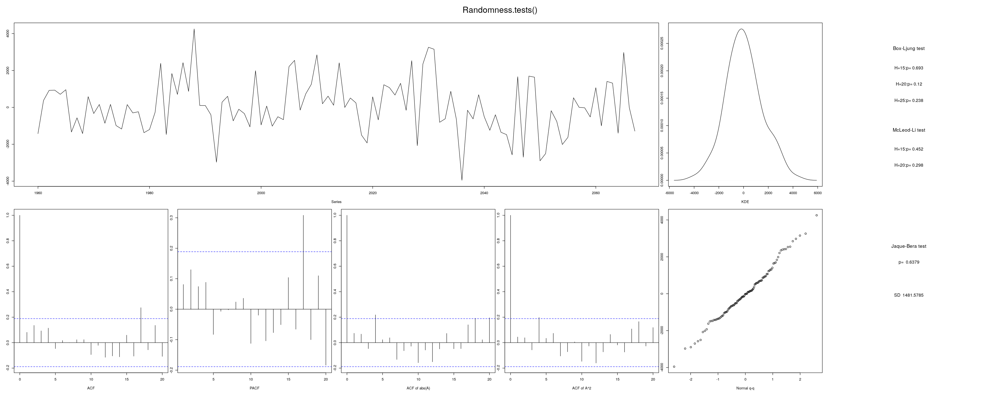

In [294]:
Randomness.tests(Fit02$residuals)

The residuals look good, the AICc is much better.
Have correlation at lag 17.

Test the model

In [301]:
h = 12
forecast2 <- forecast(Fit02, xreg=last(time(D0))+(1:h)/frequency(D0))
forecast2

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2068       13728.84 11702.20 15755.48 10629.36 16828.32
2069       14996.32 12930.61 17062.02 11837.09 18155.54
2070       20711.73 18631.44 22792.02 17530.20 23893.26
2071       23448.79 21364.27 25533.30 20260.79 26636.78
2072       26038.62 23933.21 28144.02 22818.67 29258.56
2073       22245.56 20135.04 24356.08 19017.79 25473.33
2074       19427.81 17310.64 21544.98 16189.88 22665.74
2075       17360.87 15242.05 19479.69 14120.42 20601.32
2076       17776.90 15647.12 19906.67 14519.69 21034.11
2077       21120.38 18984.17 23256.58 17853.32 24387.43
2078       18370.08 16228.32 20511.84 15094.54 21645.61
2079       16364.10 14178.84 18549.36 13022.04 19706.16

    i= 7   MLE-CSS failed.  Using CSS.
    i= 8   MLE-CSS failed.  Using CSS.
    i= 12   MLE-CSS failed.  Using CSS.
    i= 13   MLE-CSS failed.  Using CSS.
    i= 14   MLE-CSS failed.  Using CSS.
    i= 15   MLE-CSS failed.  Using CSS.
    i= 16   MLE-CSS failed.  Using CSS.
    i= 17   MLE-CSS failed.  Using CSS.

Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  -461.4847
  root Mean Squared Error:   1906.3365 




mean pred error,rMSE
-461.4847,1906.336


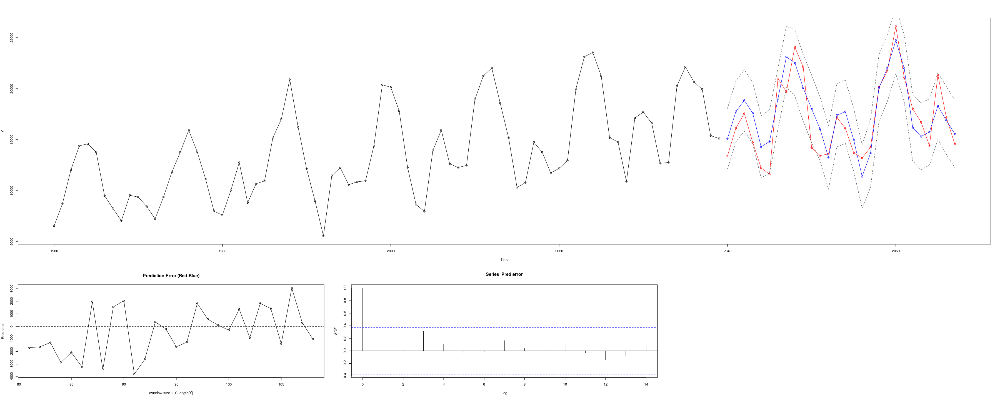

In [329]:
Y <- D0
window.size <- 80
Arima.order <- c(12,0,0)
pred.plot <- TRUE
include.mean = TRUE
include.drift = FALSE
lambda = NULL
xreg = TRUE
seasonal = c(0, 0, 0)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

95% CI is 10629.36 to 16828.32

rMSE is 1906.336 somewhat close to the sigma value of 1,581.40

Compared to the ARIMA(12,1,0) with drift model, this model has a wider 95% CI, a higher rMSE, and the rMSE is farther away from sigma.  ARIMA(12,1,0) with drift is a better model.

Try forcing higher parameters to get rid of correlation at lag 17.

In [303]:
Fit02 <- Arima(D0, order=c(17,0,17), method="CSS", include.drift=FALSE,  xreg=time(D0))
Fit02

Series: D0 
Regression with ARIMA(17,0,17) errors 

Coefficients:
          ar1     ar2     ar3     ar4     ar5      ar6      ar7     ar8     ar9
      -0.3351  0.1070  0.0008  0.1713  0.3306  -0.1769  -0.1448  0.0098  0.1197
s.e.   0.0093  0.0163  0.0235  0.0237  0.0080   0.0091   0.0192  0.0138  0.0094
         ar10    ar11    ar12    ar13    ar14    ar15     ar16    ar17     ma1
      -0.4503  0.3307  0.9130  0.0768  0.0930  0.1327  -0.7184  0.0923  0.9054
s.e.   0.0085  0.0091  0.0052  0.0139  0.0266  0.0311   0.0190  0.0111  0.0757
         ma2      ma3      ma4      ma5      ma6      ma7      ma8      ma9
      0.2296  -0.2321  -0.5404  -0.6154  -0.1518  -0.3164  -0.2914  -0.3659
s.e.  0.0782   0.0838   0.0769   0.0863   0.0965   0.1231   0.1292   0.1345
        ma10     ma11     ma12    ma13     ma14     ma15    ma16    ma17
      0.3689  -0.2010  -0.6319  0.0805  -0.5190  -0.6986  0.6582  0.1210
s.e.  0.1184   0.1313   0.1633  0.1581   0.1382   0.1696  0.1696  0.1386
        in

ma17 is not sigificant, remove it

In [304]:
Fit02 <- Arima(D0, order=c(17,0,16), include.drift=FALSE,  xreg=time(D0))
Fit02

Warning message in sqrt(diag(x$var.coef)):
“NaNs produced”


Series: D0 
Regression with ARIMA(17,0,16) errors 

Coefficients:
         ar1     ar2     ar3     ar4      ar5      ar6     ar7      ar8
      0.2397  0.2537  0.3185  0.3321  -0.3937  -0.3822  0.1536  -0.0766
s.e.     NaN     NaN  0.0879     NaN      NaN      NaN     NaN   0.0391
          ar9     ar10    ar11    ar12     ar13     ar14     ar15     ar16
      -0.0294  -0.2605  0.3982  0.5865  -0.1785  -0.1638  -0.4316  -0.4922
s.e.   0.0421      NaN     NaN     NaN      NaN      NaN   0.0498      NaN
        ar17    ma1      ma2      ma3      ma4     ma5     ma6      ma7     ma8
      0.6513  0.154  -0.2254  -0.3477  -0.4504  0.2809  0.2741  -0.1995  0.0765
s.e.     NaN    NaN      NaN   0.1559      NaN     NaN     NaN      NaN     NaN
         ma9    ma10     ma11     ma12     ma13     ma14    ma15    ma16
      0.0963  0.6724  -0.0612  -0.4722  -0.0644  -0.2424  0.4613  0.4592
s.e.     NaN  0.1583      NaN   0.1679      NaN   0.1336     NaN     NaN
       intercept     xreg
      -1

ma15 and ma16 not significant, remove them

In [117]:
Fit02 <- Arima(D0, order=c(17,0,14), method = "CSS", include.drift=FALSE,  xreg=time(D0))
Fit02

Series: D0 
Regression with ARIMA(17,0,14) errors 

Coefficients:
          ar1     ar2     ar3     ar4      ar5      ar6     ar7      ar8
      -0.3048  0.0427  0.0406  0.4070  -0.0283  -0.3575  0.3014  -0.2223
s.e.   0.1045  0.0725  0.0657  0.0305   0.0484   0.0590  0.0287   0.0331
          ar9    ar10    ar11    ar12    ar13     ar14     ar15     ar16
      -0.1047  0.0168  0.0495  0.7791  0.4904  -0.1788  -0.0805  -0.4407
s.e.   0.0529  0.0503  0.0435  0.0334  0.0669   0.0853   0.0503   0.0147
        ar17     ma1      ma2      ma3      ma4      ma5     ma6      ma7
      0.1374  0.7109  -0.1027  -0.1685  -0.5599  -0.3476  0.2721  -0.7163
s.e.  0.0850  0.1595   0.0786   0.1148   0.1078   0.1507  0.1518   0.1232
          ma8     ma9     ma10    ma11     ma12     ma13    ma14    intercept
      -0.2404  0.1765  -0.2223  0.1263  -0.3357  -0.7391  0.0656  -120323.005
s.e.   0.1840  0.1143   0.1180  0.1571   0.1066   0.1396  0.0606     5389.844
         xreg
      67.2022
s.e.   2.675

As before, most ma terms are not significant, try removing them.

In [307]:
Fit02 <- Arima(D0, order=c(17,0,0), method = "CSS", include.drift=FALSE,  xreg=time(D0))
Fit02

Series: D0 
Regression with ARIMA(17,0,0) errors 

Coefficients:
         ar1     ar2      ar3     ar4     ar5      ar6     ar7      ar8
      0.2742  0.1678  -0.0437  0.0109  0.0163  -0.2253  0.0450  -0.1094
s.e.  0.0929  0.0924   0.0953  0.0963  0.0957   0.0835  0.0805   0.0798
          ar9     ar10    ar11    ar12     ar13     ar14     ar15     ar16
      -0.0050  -0.1222  0.3004  0.5370  -0.1458  -0.0710  -0.0485  -0.2771
s.e.   0.0806   0.0801  0.0808  0.0836   0.0981   0.0989   0.0989   0.0979
        ar17   intercept     xreg
      0.3098  -113078.55  63.6507
s.e.  0.0985    37469.04  18.3392

sigma^2 estimated as 2005910:  part log likelihood=-935.67

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.698,0.481,0.687,0.677,0.807,0.196,1291.692


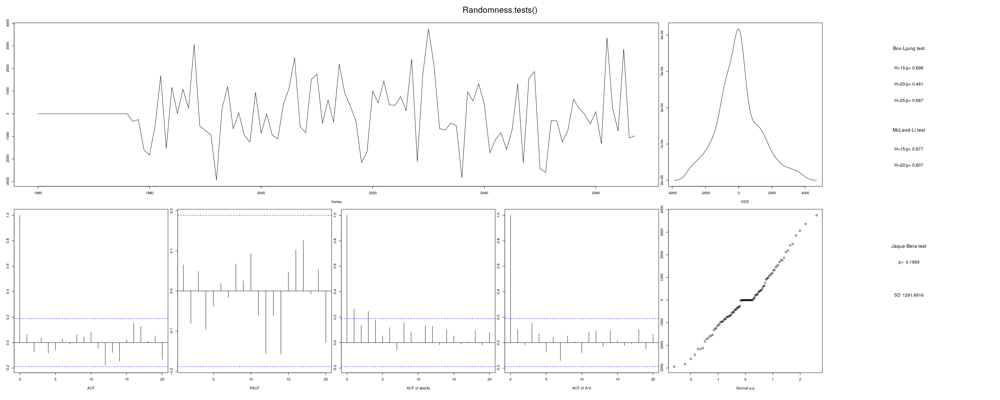

In [306]:
Randomness.tests(Fit02$residuals)

Residuals look good, and we got rid of the correlation at lag 17.

Test the model

In [308]:
h = 12
forecast2 <- forecast(Fit02, xreg=last(time(D0))+(1:h)/frequency(D0))
forecast2

     Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
2068       13081.26 11266.20 14896.32 10305.36 15857.16
2069       14647.45 12765.38 16529.51 11769.08 17525.81
2070       20372.86 18439.82 22305.89 17416.54 23329.17
2071       22891.17 20954.10 24828.25 19928.67 25853.68
2072       25862.70 23922.70 27802.69 22895.73 28829.66
2073       21583.45 19642.34 23524.56 18614.78 24552.13
2074       18837.59 16862.37 20812.81 15816.75 21858.43
2075       16991.47 15012.86 18970.07 13965.45 20017.49
2076       16540.77 14528.18 18553.37 13462.78 19618.77
2077       21909.98 19889.88 23930.08 18820.51 24999.45
2078       17796.16 15737.18 19855.13 14647.22 20945.09
2079       15941.95 13856.86 18027.04 12753.08 19130.82

    i= 7   MLE-CSS failed.  Using CSS.
    i= 8   MLE-CSS failed.  Using CSS.
    i= 12   MLE-CSS failed.  Using CSS.
    i= 13   MLE-CSS failed.  Using CSS.
    i= 14   MLE-CSS failed.  Using CSS.
    i= 15   MLE-CSS failed.  Using CSS.
    i= 16   MLE-CSS failed.  Using CSS.
    i= 17   MLE-CSS failed.  Using CSS.

Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  -461.4847
  root Mean Squared Error:   1906.3365 




mean pred error,rMSE
-461.4847,1906.336


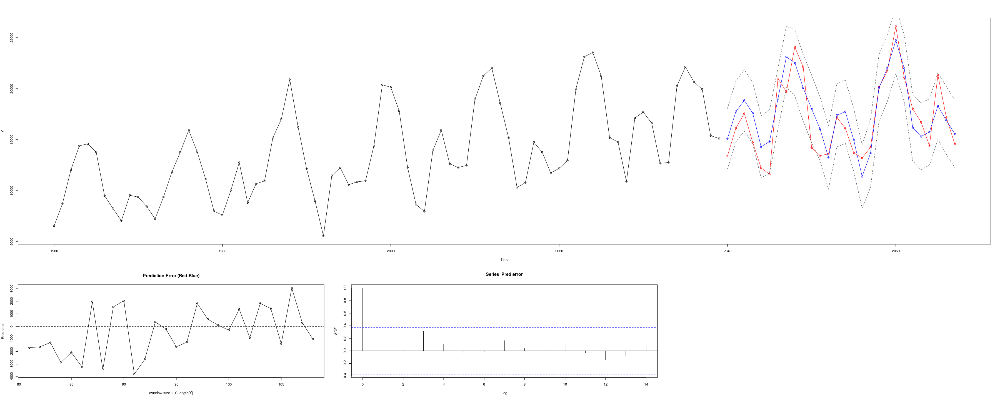

In [330]:
Y <- D0
window.size <- 80
Arima.order <- c(12,0,0)
pred.plot <- TRUE
include.mean = TRUE
include.drift = FALSE
lambda = NULL
xreg = TRUE
seasonal = c(0, 0, 0)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

95% CI is 10305.36 to 15857.16

rMSE is 1,906.336 which is to the sigma value of 1,415.30

Compared to the ARIMA(12,1,0) with drift model, The 95% is slightly smaller, but the rMSE if higher, and further from the sigma value.  And this is a signficantly more complicated model.  So ARIMA(12,1,0) with drift is still the best model so far.

There are a number of ar terms that are not significant, try manually setting them to 0.

In [123]:
Fit02 <- Arima(D0, order=c(17,0,0), method = "CSS", include.drift=FALSE,  xreg=time(D0), fixed = c(NA,NA,0,0,0,NA,0,0,0,NA,NA,NA,0,0,0,NA,NA,NA,NA))
Fit02

Series: D0 
Regression with ARIMA(17,0,0) errors 

Coefficients:
         ar1     ar2  ar3  ar4  ar5      ar6  ar7  ar8  ar9     ar10    ar11
      0.1790  0.0654    0    0    0  -0.1916    0    0    0  -0.1530  0.3535
s.e.  0.0748  0.0673    0    0    0   0.0652    0    0    0   0.0682  0.0736
        ar12  ar13  ar14  ar15     ar16    ar17   intercept      xreg
      0.5426     0     0     0  -0.2911  0.3665    9557.514    5.7987
s.e.  0.0771     0     0     0   0.0659  0.0791  228997.601  105.6338

sigma^2 estimated as 2004427:  part log likelihood=-940.83

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.212,0.149,0.37,0.634,0.462,0.036,1354.928


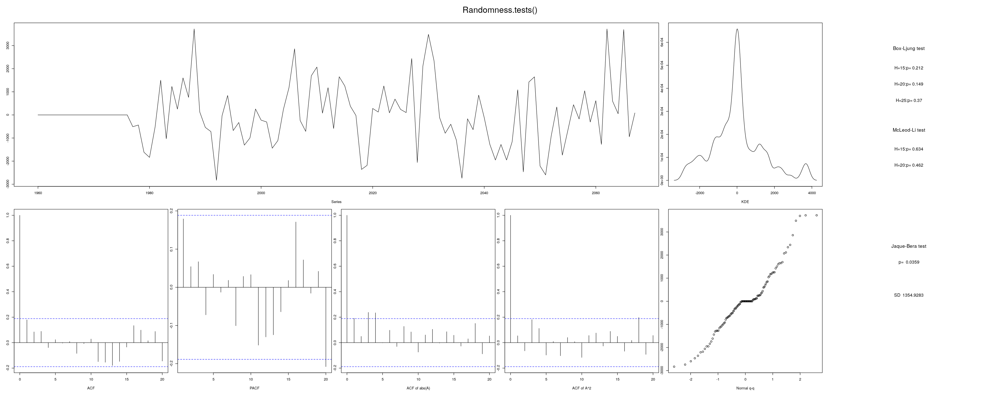

In [124]:
Randomness.tests(Fit02$residuals)

The residual values are no longer normal.

## Try as seasonal time series

In [125]:
D1 <- ts(D[,2], start=c(1960,1), freq=12)

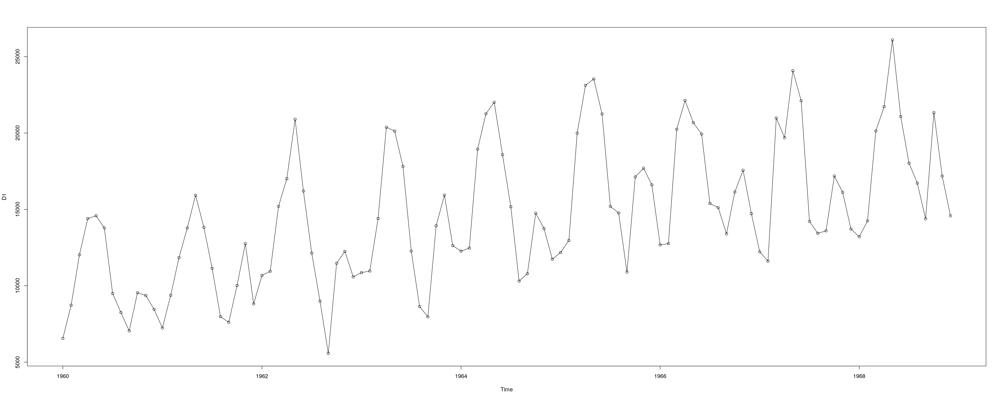

In [162]:
options(repr.plot.width=30, repr.plot.height=12)
plot(D1, type='o')

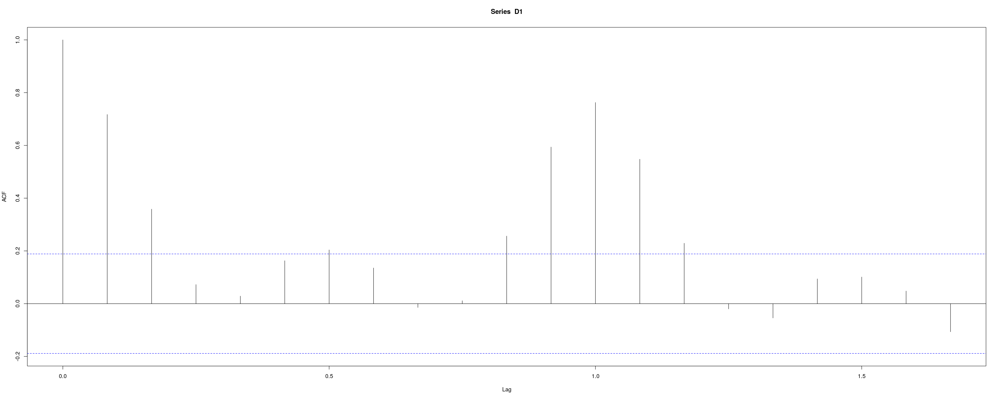

In [269]:
acf(D1)

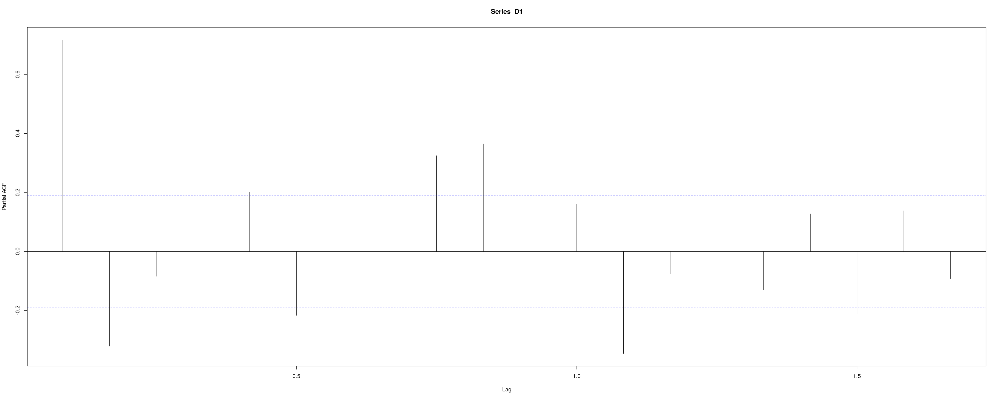

In [270]:
pacf(D1)

In [271]:
Stationarity.tests(D1)

Warning message in adf.test(A):
“p-value smaller than printed p-value”
Warning message in pp.test(A):
“p-value smaller than printed p-value”
Warning message in kpss.test(A):
“p-value smaller than printed p-value”


,KPSS,ADF,PP
p-val:,0.01,0.01,0.01


### Try with Linear Trend + Seasonality

In [139]:
Y <- D1
Mav1 <- aggregate(c(Y), list(month=cycle(Y)),mean)$x
Y.MtlyAv <- ts(Mav1[cycle(Y)], start=start(Y), freq=frequency(Y))
Y.DS <- Y-Y.MtlyAv

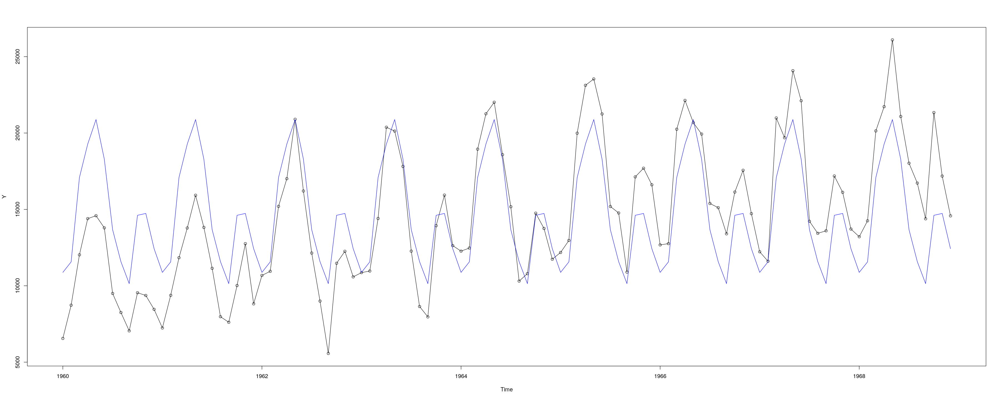

In [140]:
plot(Y, type="o")
lines(Y.MtlyAv, col="blue")

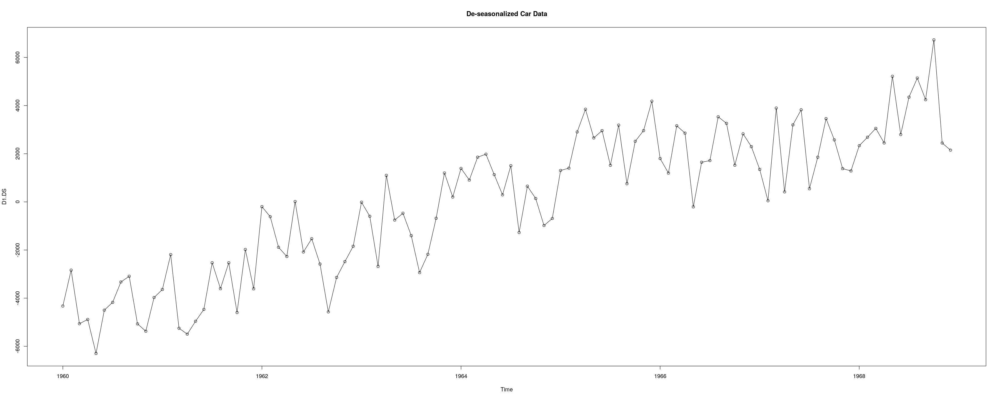

In [141]:
D1.DS <- Y.DS
plot(D1.DS, type="o", main="De-seasonalized Car Data")

In [142]:
Reg1 <- lm(D1.DS ~ time(D1.DS))
summary(Reg1)


Call:
lm(formula = D1.DS ~ time(D1.DS))

Residuals:
     Min       1Q   Median       3Q      Max 
-2780.14 -1170.29    32.08  1095.25  3055.02 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -1964675.3   102944.8  -19.09   <2e-16 ***
time(D1.DS)     1000.1       52.4   19.09   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1415 on 106 degrees of freedom
Multiple R-squared:  0.7746,	Adjusted R-squared:  0.7725 
F-statistic: 364.2 on 1 and 106 DF,  p-value: < 2.2e-16


Slope is 1000.1

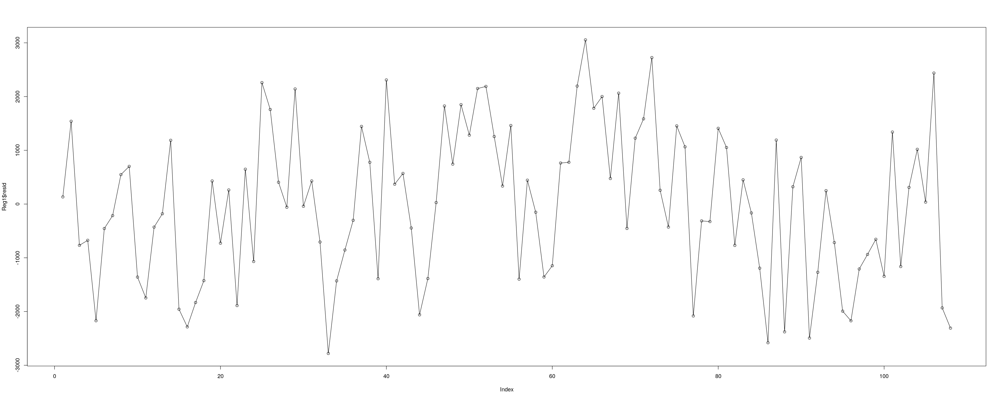

In [143]:
plot(Reg1$resid, type="o")
abline(Reg1, col="red")

In [144]:
Stationarity.tests(Reg1$resid)

Warning message in pp.test(A):
“p-value smaller than printed p-value”
Warning message in kpss.test(A):
“p-value greater than printed p-value”


,KPSS,ADF,PP
p-val:,0.1,0.047,0.01


It is stationary

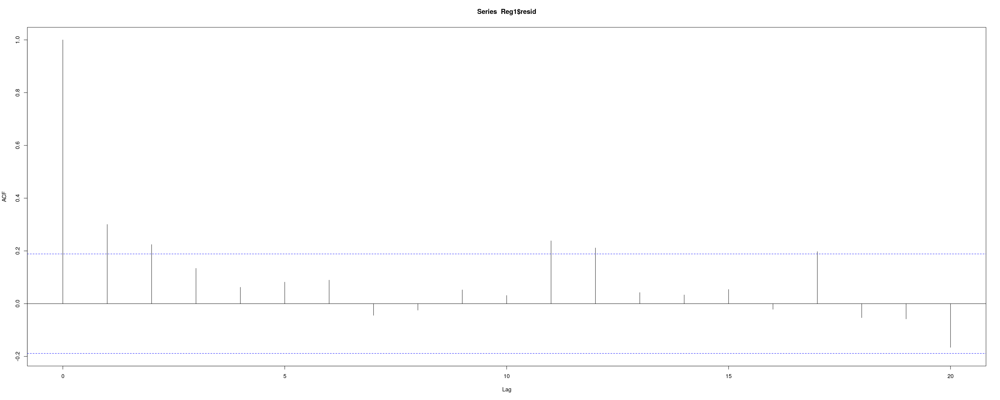

In [145]:
acf(Reg1$resid)

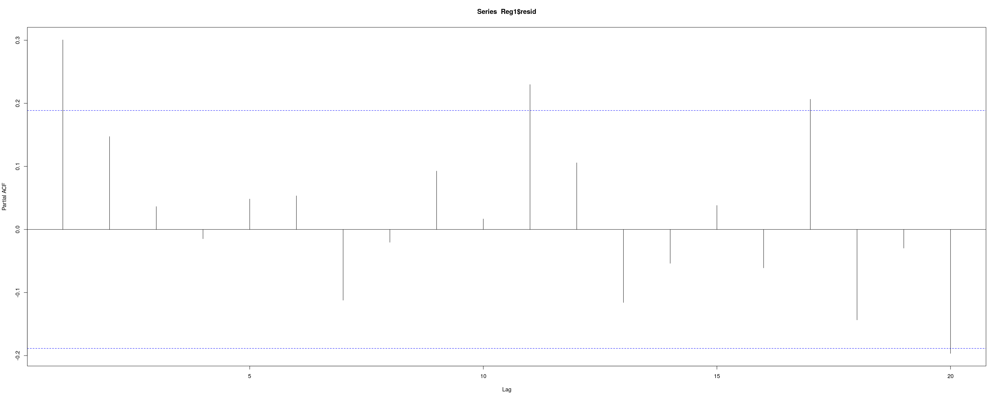

In [146]:
pacf(Reg1$resid)

In [148]:
Fit11 <- auto.arima(D1.DS, d=0, D=0, xreg=time(D1.DS), stepwise=FALSE, approximation=FALSE)
Fit11

Series: D1.DS 
Regression with ARIMA(2,0,0)(0,0,1)[12] errors 

Coefficients:
         ar1     ar2    sma1   intercept      xreg
      0.2259  0.1858  0.2287  -1935045.9  985.0167
s.e.  0.0951  0.0960  0.1012    179822.7   91.5382

sigma^2 estimated as 1735474:  log likelihood=-926.89
AIC=1865.78   AICc=1866.61   BIC=1881.87

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.938,0.3,0.44,0.141,0.188,0.269,1292.516


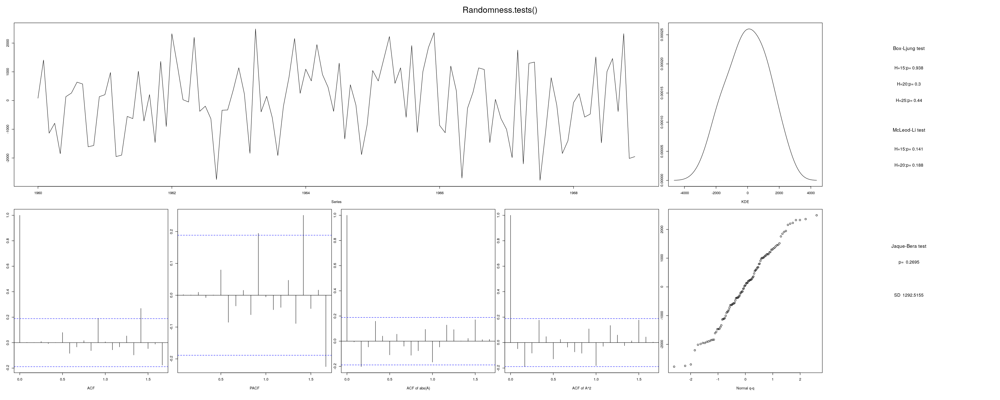

In [149]:
Randomness.tests(Fit11$resid)

Residuals look good, but there is correlation at log 11 and 17

In [151]:
h <- 12
Y <- D1.DS
Fit00 <- Fit11

Y.pred = forecast(Fit00, h, xreg=last(time(Y))+(1:h)/frequency(Y))
Y.pred

         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       3591.349 1903.066 5279.631 1009.343 6173.354
Feb 1969       3981.900 2251.066 5712.733 1334.818 6628.981
Mar 1969       4199.917 2423.479 5976.356 1483.089 6916.746
Apr 1969       4393.869 2610.127 6177.610 1665.871 7121.866
May 1969       4981.357 3194.180 6768.534 2248.105 7714.608
Jun 1969       4514.381 2726.358 6302.404 1779.836 7248.926
Jul 1969       5133.915 3345.588 6922.243 2398.905 7868.926
Aug 1969       5339.329 3550.914 7127.744 2604.185 8074.473
Sep 1969       5127.145 3338.701 6915.588 2391.957 7862.333
Oct 1969       5785.677 3997.224 7574.129 3050.475 8520.878
Nov 1969       4949.714 3161.260 6738.169 2214.509 7684.920
Dec 1969       4946.083 3157.627 6734.539 2210.876 7681.290

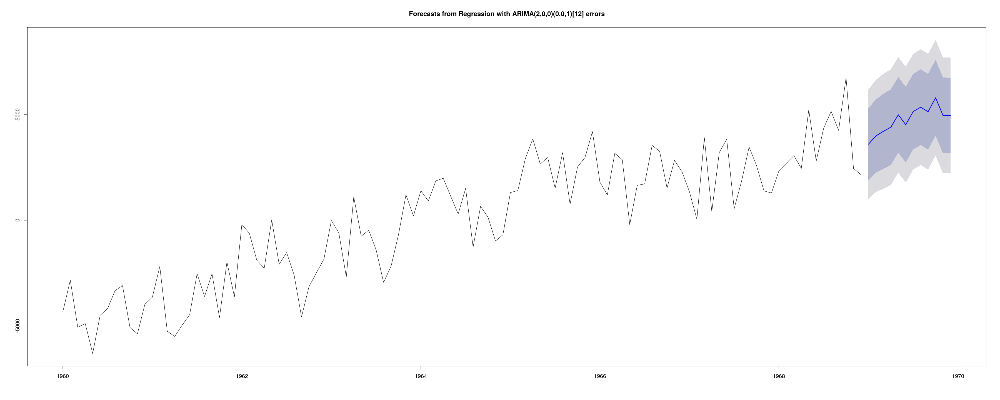

In [152]:
plot(Y.pred)

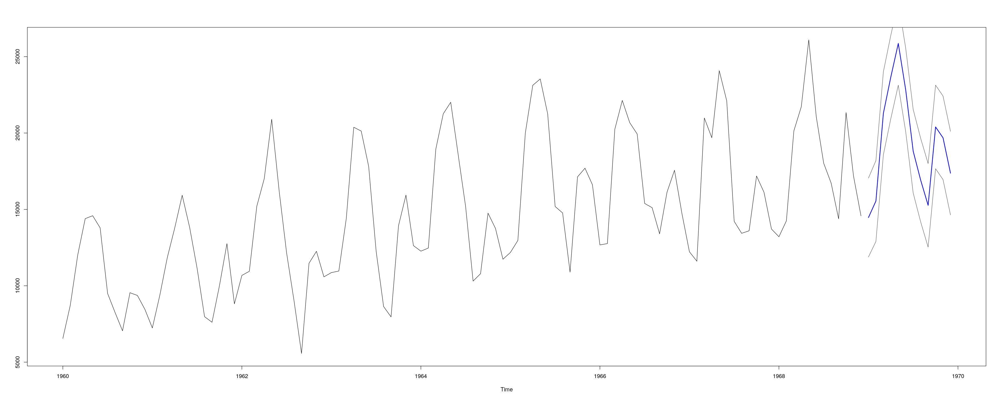

In [153]:
Y <- D1
Mav <- Mav1
Y.h <- Y.pred

Yhat = ts(Y.h$mean + Mav1, start=last(time(Y))+(1)/frequency(Y), freq=frequency(Y))
Yhat.CIu = ts(Y.h$lower[,2] + Mav1, start=last(time(Y))+(1)/frequency(Y), freq=frequency(Y))
Yhat.CIl = ts(Y.h$upper[,2]+ Mav1, start=last(time(Y))+(1)/frequency(Y), freq=frequency(Y))

ts.plot(Y,Yhat)
lines(Yhat, type="l", col="blue", lwd=2)
lines(Yhat.CIu, type="l", col="gray30", lty=1)
lines(Yhat.CIl, type="l", col="gray30", lty=1)

In [156]:
str(Yhat.CIu)

 Time-Series [1:12] from 1969 to 1970: 11885 12898 18569 20944 23132 ...


In [157]:
str(Yhat.CIl)

 Time-Series [1:12] from 1969 to 1970: 17049 18192 24003 26400 28598 ...


95% CI for next prediction is 11,885 to 17,049

### See what auto.arima() gives

In [310]:
Fit2 <- auto.arima(D1, stepwise = FALSE, approximation = FALSE)
Fit2

Series: D1 
ARIMA(2,0,0)(0,1,2)[12] with drift 

Coefficients:
         ar1     ar2     sma1     sma2    drift
      0.2088  0.1965  -0.5695  -0.2326  83.3338
s.e.  0.1001  0.1009   0.1715   0.1591   8.9502

sigma^2 estimated as 2159951:  log likelihood=-839.05
AIC=1690.09   AICc=1691.04   BIC=1705.48

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.945,0.209,0.347,0.087,0.033,0.81,1354.123


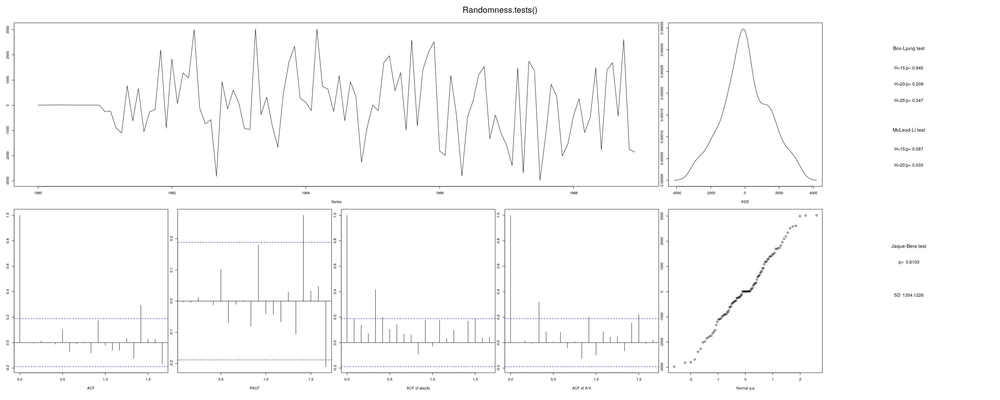

In [28]:
Randomness.tests(Fit2$residuals)

Auto.arima() gives a model of ARIMA(2,0,0)(0,1,2)[12] with drift.

  the residuals look good, however the ACF and PACF graphs are showing some correlation at lag 17

Test the model

In [311]:
forecast1 <- forecast(Fit2, 12)
forecast1

         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       14792.12 12896.51 16687.72 11893.04 17691.20
Feb 1969       15749.16 13812.87 17685.45 12787.86 18710.46
Mar 1969       21623.48 19634.71 23612.26 18581.91 24665.06
Apr 1969       23806.78 21810.55 25803.02 20753.81 26859.76
May 1969       26190.34 24190.19 28190.50 23131.37 29249.31
Jun 1969       22781.96 20780.91 24783.01 19721.62 25842.31
Jul 1969       18888.63 16887.23 20890.02 15827.76 21949.50
Aug 1969       17156.29 15154.80 19157.78 14095.28 20217.30
Sep 1969       15286.28 13284.78 17287.79 12225.24 18347.32
Oct 1969       20673.31 18671.82 22674.79 17612.29 23734.32
Nov 1969       19254.14 17252.83 21255.44 16193.41 22314.87
Dec 1969       16861.71 14860.54 18862.87 13801.19 19922.22


Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  -651.561
  root Mean Squared Error:   3419.1345 




mean pred error,rMSE
-651.561,3419.135


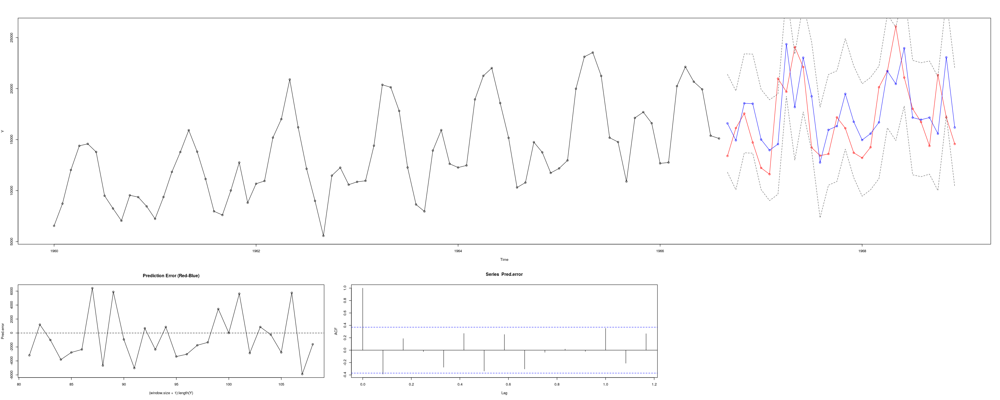

In [331]:
Y <- D1
window.size <- 80
Arima.order <- c(2,0,0)
pred.plot <- TRUE
include.mean = TRUE
include.drift = TRUE
lambda = NULL
xreg = FALSE
seasonal = c(0, 1, 2)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

95% CI is 11893.04 to 17691.20

rMSE is 3419.135 which is pretty far from the sigma value of 1,469.68

This model does not appear to be performing very well.

In [ ]:
The sma2 term included in the model does not seems to be significant.  Try removing it, but first make sure taking a seasonal difference is appropriate

In [158]:
Fit21 <- Arima(D1, order=c(0,0,0), seasonal=c(0,1,1))
Fit21

Series: D1 
ARIMA(0,0,0)(0,1,1)[12] 

Coefficients:
         sma1
      -0.0353
s.e.   0.0883

sigma^2 estimated as 4134535:  log likelihood=-867
AIC=1737.99   AICc=1738.12   BIC=1743.12

In [159]:
Fit21 <- Arima(D1, order=c(0,0,0), seasonal=c(0,1,1), include.drift = TRUE)
Fit21

Series: D1 
ARIMA(0,0,0)(0,1,1)[12] with drift 

Coefficients:
         sma1    drift
      -0.5064  83.6314
s.e.   0.1474   7.7551

sigma^2 estimated as 2591944:  log likelihood=-845.85
AIC=1697.69   AICc=1697.95   BIC=1705.38

sma1 is not close to 1, so seasonal differencing is appropriate

In [160]:
Arima(D1, order=c(0,0,12), seasonal=c(0,1,0))

Series: D1 
ARIMA(0,0,12)(0,1,0)[12] 

Coefficients:
         ma1     ma2     ma3     ma4     ma5     ma6     ma7     ma8     ma9
      0.3465  0.4332  0.3298  0.3575  0.3024  0.2481  0.0842  0.0024  0.2462
s.e.  0.1132  0.1127  0.1295  0.1324  0.1306  0.1510  0.1337  0.1339  0.1330
        ma10    ma11     ma12
      0.2174  0.4920  -0.4574
s.e.  0.1154  0.1265   0.1426

sigma^2 estimated as 2057518:  log likelihood=-836.62
AIC=1699.24   AICc=1703.68   BIC=1732.57

In [161]:
Arima(D1, order=c(0,0,12), seasonal=c(0,1,0), include.drift=TRUE)

Series: D1 
ARIMA(0,0,12)(0,1,0)[12] with drift 

Coefficients:
         ma1     ma2     ma3     ma4     ma5     ma6      ma7      ma8     ma9
      0.2404  0.3353  0.1917  0.2135  0.1251  0.0412  -0.1002  -0.1509  0.1045
s.e.  0.1185  0.1137  0.1326  0.1302  0.1226  0.1484   0.1418   0.1431  0.1365
        ma10    ma11     ma12    drift
      0.0923  0.3753  -0.5947  80.5570
s.e.  0.1125  0.1190   0.1476  20.6764

sigma^2 estimated as 1944245:  log likelihood=-833.37
AIC=1694.74   AICc=1699.93   BIC=1730.65

The ma's'are not close to 1, so this looks good.

### Try model that auto.arima() gave with sma2 term removed.

In [30]:
Fit22 <- Arima(D1, order=c(2,0,0), seasonal=c(0,1,1), include.drift = TRUE)
Fit22

Series: D1 
ARIMA(2,0,0)(0,1,1)[12] with drift 

Coefficients:
         ar1     ar2     sma1    drift
      0.2271  0.1838  -0.5493  83.1017
s.e.  0.1017  0.1008   0.1412  11.4968

sigma^2 estimated as 2341354:  log likelihood=-840.38
AIC=1690.77   AICc=1691.43   BIC=1703.59

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.838,0.17,0.27,0.032,0.028,0.978,1418.711


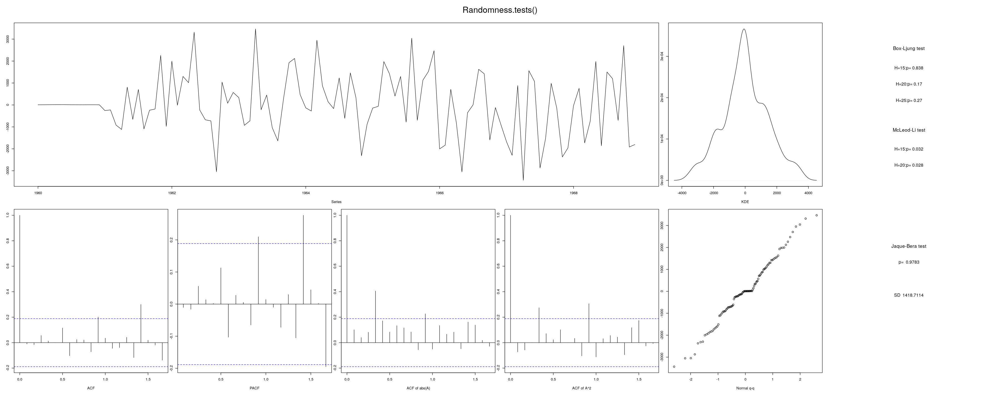

In [31]:
Randomness.tests(Fit22$residuals)

AR2 term is not significant

However two of the Box-Ljung tests are showing correlation now, and the ACF and PACF plots have gotten worse, confirming this.

The Jaque-Bera p value is low indicating the residuals are not normal

There seem to be some indicators that there may be correlation at lag 11.  Try forcing bigging p and q values.

### Try manually forcing p and q to be higher

In [32]:
Fit23 <- Arima(D1, order=c(11,0,11), seasonal=c(0,1,1), include.drift = TRUE)
Fit23

Series: D1 
ARIMA(11,0,11)(0,1,1)[12] with drift 

Coefficients:
         ar1     ar2     ar3     ar4      ar5     ar6      ar7      ar8
      0.0362  0.2954  0.4661  0.4065  -0.3503  0.4793  -0.1341  -0.3191
s.e.  0.1560  0.1389  0.0916  0.1634   0.1342  0.1589   0.1256   0.1713
          ar9     ar10    ar11     ma1      ma2      ma3      ma4     ma5
      -0.3685  -0.4684  0.6613  0.3236  -0.1199  -0.4500  -0.4788  0.2891
s.e.   0.0879   0.1276  0.1506  0.2042   0.1669   0.1505   0.1573  0.1751
          ma6      ma7     ma8     ma9    ma10     ma11     sma1    drift
      -0.6242  -0.2999  0.1289  0.5654  0.8585  -0.2453  -0.5220  85.4074
s.e.   0.1404   0.2120  0.2247  0.1619  0.2041   0.2588   0.1866  16.3609

sigma^2 estimated as 1738836:  log likelihood=-824.21
AIC=1698.42   AICc=1717   BIC=1762.53

ma11 is not significant, try removing it

In [313]:
Fit24 <- Arima(D1, order=c(11,0,10), seasonal=c(0,1,1), include.drift = TRUE)
Fit24

Series: D1 
ARIMA(11,0,10)(0,1,1)[12] with drift 

Coefficients:
          ar1     ar2     ar3     ar4      ar5     ar6      ar7      ar8
      -0.0995  0.2325  0.4988  0.4941  -0.3049  0.4003  -0.0663  -0.2292
s.e.   0.1035  0.1219  0.1067  0.1138   0.1836  0.1607   0.1233   0.1279
          ar9     ar10    ar11     ma1      ma2      ma3      ma4     ma5
      -0.3386  -0.5380  0.5267  0.4958  -0.0175  -0.4389  -0.5577  0.2079
s.e.   0.1066   0.0852  0.1024  0.1155   0.1519   0.1433   0.1386  0.2015
          ma6      ma7      ma8     ma9    ma10     sma1    drift
      -0.5621  -0.4392  -0.0096  0.4971  0.9900  -0.4451  84.4929
s.e.   0.1571   0.1400   0.1483  0.1204  0.1342   0.1566  16.1492

sigma^2 estimated as 1754542:  log likelihood=-824.66
AIC=1697.32   AICc=1714.22   BIC=1758.86

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.999,0.992,0.997,0.102,0.087,0.758,1094.081


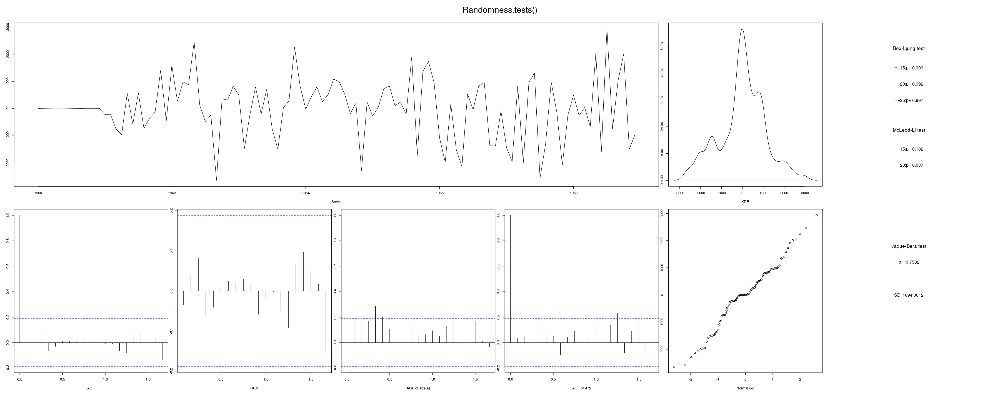

In [35]:
Randomness.tests(Fit24$residuals)

The residuals look good, the ACF and PACF graphs now do not have any issues.

However there are a lot of terms in the model and not all are significant.

Test the model

In [314]:
forecast1 <- forecast(Fit24, 12)
forecast1

         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       14048.57 12283.76 15813.38 11349.53 16747.61
Feb 1969       14822.91 12929.09 16716.74 11926.56 17719.27
Mar 1969       21346.69 19427.71 23265.67 18411.87 24281.52
Apr 1969       23179.37 21245.53 25113.21 20221.82 26136.92
May 1969       25672.33 23717.42 27627.25 22682.55 28662.12
Jun 1969       22809.58 20825.93 24793.23 19775.85 25843.31
Jul 1969       20249.12 18262.34 22235.90 17210.61 23287.63
Aug 1969       16893.72 14884.40 18903.04 13820.73 19966.71
Sep 1969       16070.98 14059.41 18082.55 12994.55 19147.41
Oct 1969       21663.98 19650.80 23677.16 18585.09 24742.87
Nov 1969       19105.70 17089.33 21122.07 16021.93 22189.47
Dec 1969       15899.94 13850.88 17949.00 12766.17 19033.70

    i= 5   MLE-CSS failed.  Using CSS.


Warning message in predict.Arima(object, n.ahead = h, newxreg = xreg):
“MA part of model is not invertible”



Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  -1109.9028
  root Mean Squared Error:   2142.4802 




mean pred error,rMSE
-1109.903,2142.48


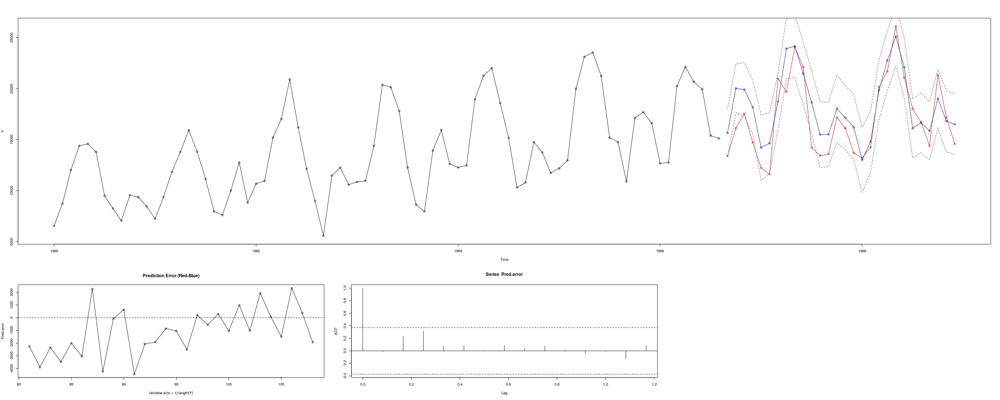

In [332]:
Y <- D1
window.size <- 80
Arima.order <- c(11,0,10)
pred.plot <- TRUE
include.mean = TRUE
include.drift = TRUE
lambda = NULL
xreg = FALSE
seasonal = c(0, 1, 1)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

Does not seem like a good model

### Try changing the seasonal length to 11
Since we do not have a sar term, and there seems to be correlation at lag 11, try using a seasonal length of 11 instead of 12

In [36]:
D11 <- ts(D[,2], start=c(1960,1), freq=11)

In [37]:
Fit25 <- auto.arima(D11, stepwise = FALSE, approximation = FALSE)
Fit25

Series: D11 
ARIMA(0,1,3)(2,0,0)[11] 

Coefficients:
          ma1     ma2      ma3    sar1     sar2
      -0.4420  0.0510  -0.4876  0.5870  -0.3325
s.e.   0.1033  0.1148   0.0911  0.1213   0.1106

sigma^2 estimated as 6449765:  log likelihood=-991.17
AIC=1994.34   AICc=1995.18   BIC=2010.38

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0,0,0,0.09,0.091,0.787,2442.719


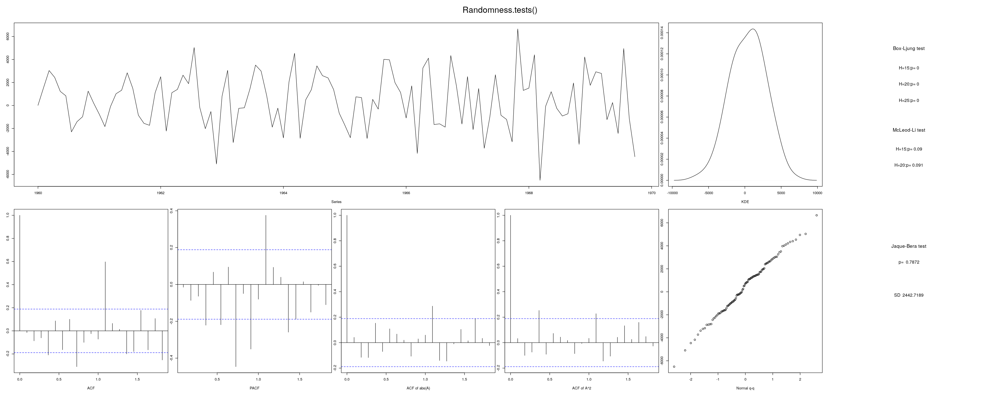

In [38]:
Randomness.tests(Fit25$residuals)

There is a lot of correlation at lag 12, more correlation than we where seeing at lag 11 when we had the seasonal length set to 12.  The Box-Ljung numbers are all 0, confirming that there is a lot of correlation.  The AICc number is higher.  Everything indicates that this is a worse model.

### Investigate d and D

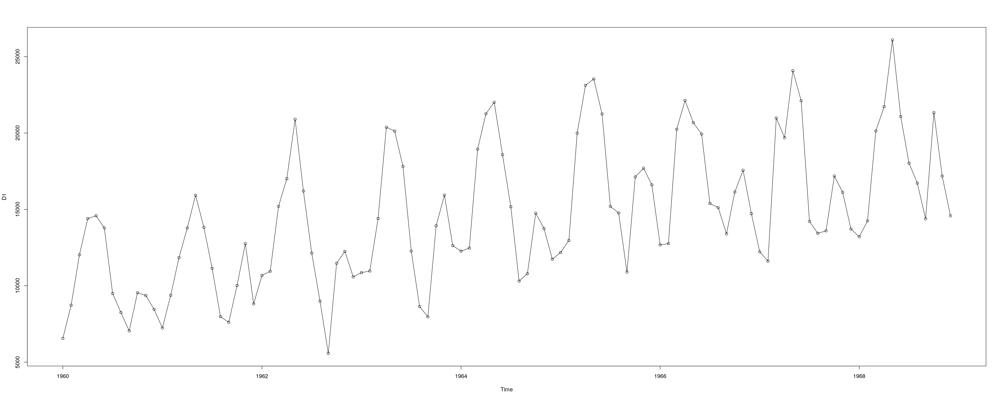

In [42]:
plot(D1, type='o')

In [344]:
Stationarity.tests(D1)

Warning message in adf.test(A):
“p-value smaller than printed p-value”
Warning message in pp.test(A):
“p-value smaller than printed p-value”
Warning message in kpss.test(A):
“p-value smaller than printed p-value”


,KPSS,ADF,PP
p-val:,0.01,0.01,0.01


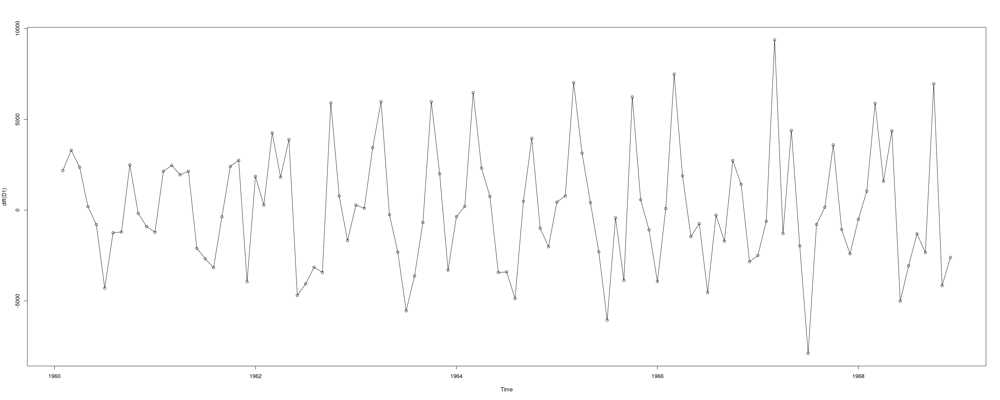

In [43]:
plot(diff(D1), type='o')

In [44]:
Stationarity.tests(diff(D1))

Warning message in adf.test(A):
“p-value smaller than printed p-value”
Warning message in pp.test(A):
“p-value smaller than printed p-value”
Warning message in kpss.test(A):
“p-value greater than printed p-value”


,KPSS,ADF,PP
p-val:,0.1,0.01,0.01


It is stationary with d=1

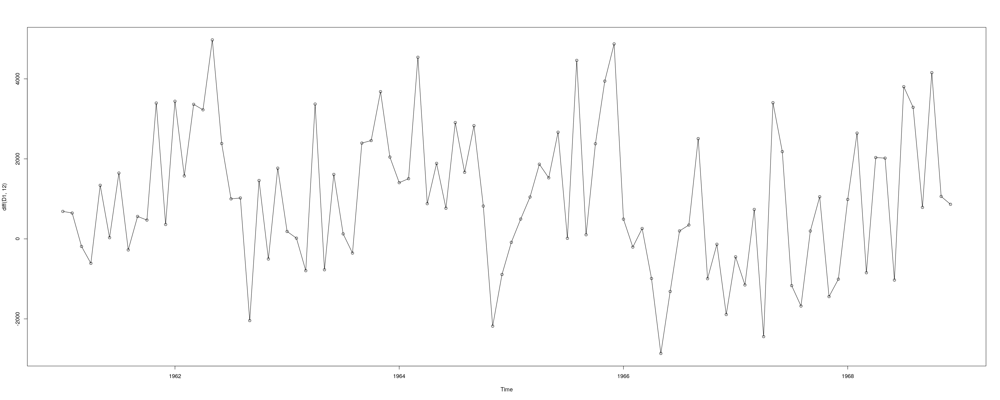

In [46]:
plot(diff(D1, 12), type='o')

In [47]:
Stationarity.tests(diff(D1, 12))

Warning message in pp.test(A):
“p-value smaller than printed p-value”
Warning message in kpss.test(A):
“p-value greater than printed p-value”


,KPSS,ADF,PP
p-val:,0.1,0.021,0.01


It is stationary with D=1.

### Try it with just d=1 (D=0)

In [316]:
Fit3 <- auto.arima(D1, d=1, D=0, stepwise = FALSE, approximation = FALSE)
Fit3

Series: D1 
ARIMA(2,1,1)(1,0,0)[12] 

Coefficients:
         ar1     ar2      ma1    sar1
      0.2424  0.2084  -0.9614  0.8811
s.e.  0.1027  0.1010   0.0235  0.0384

sigma^2 estimated as 2810698:  log likelihood=-953.23
AIC=1916.45   AICc=1917.04   BIC=1929.81

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.637,0.038,0.056,0.97,0.879,0.465,1632.19


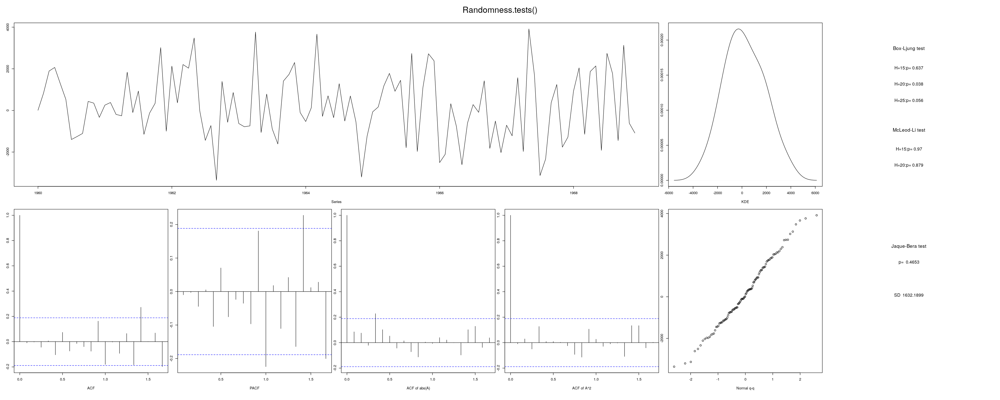

In [49]:
Randomness.tests(Fit3$residuals)

The suggested model is ARIMA(2,1,1)(1,0,0)[12]

The residuals still look good, though the PACF graph is still slightly concerning.

Test the model

In [317]:
forecast1 <- forecast(Fit3, 12)
forecast1

         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       14387.09 12238.54 16535.64 11101.17 17673.02
Feb 1969       15265.02 13033.21 17496.82 11851.77 18678.26
Mar 1969       20496.08 18163.80 22828.35 16929.17 24062.98
Apr 1969       21895.77 19533.86 24257.68 18283.53 25508.01
May 1969       25759.19 23376.42 28141.96 22115.06 29403.32
Jun 1969       21343.37 18948.85 23737.90 17681.26 25005.48
Jul 1969       18649.94 16246.57 21053.31 14974.30 22325.58
Aug 1969       17504.01 15093.73 19914.28 13817.81 21190.20
Sep 1969       15445.78 13029.51 17862.05 11750.41 19141.15
Oct 1969       21575.92 19154.20 23997.63 17872.23 25279.60
Nov 1969       17909.15 15482.31 20336.00 14197.61 21620.69
Dec 1969       15615.87 13184.07 18047.66 11896.76 19334.97


Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  167.3186
  root Mean Squared Error:   3435.95 




mean pred error,rMSE
167.3186,3435.95


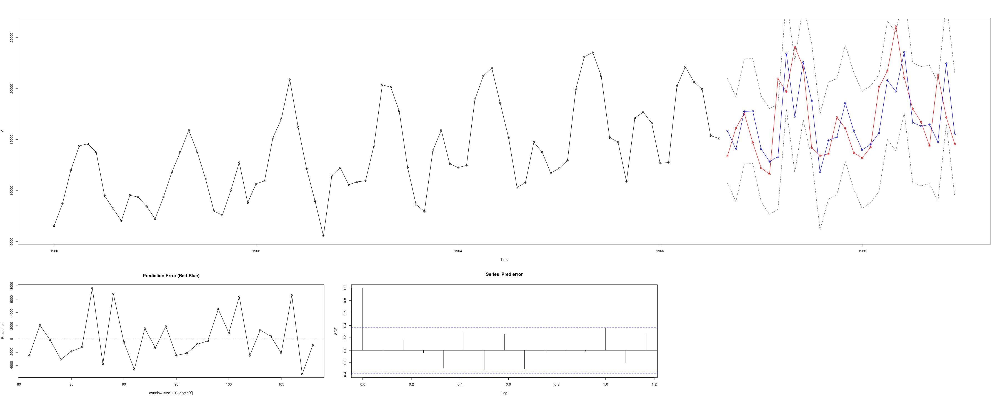

In [333]:
Y <- D1
window.size <- 80
Arima.order <- c(2,1,1)
pred.plot <- TRUE
include.mean = TRUE
include.drift = FALSE
lambda = NULL
xreg = FALSE
seasonal = c(1,0,0)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

In [ ]:
The model doe not appear to be performing well.

Try forcing higher p and q values

In [319]:
Fit24 <- Arima(D1, order=c(11,1,10), seasonal=c(1,0,0), include.drift = FALSE)
Fit24

Warning message in sqrt(diag(x$var.coef)):
“NaNs produced”


Series: D1 
ARIMA(11,1,10)(1,0,0)[12] 

Coefficients:
          ar1      ar2      ar3      ar4      ar5      ar6      ar7      ar8
      -0.4878  -0.4243  -0.7262  -0.5656  -0.5373  -0.3615  -0.0947  -0.1000
s.e.   0.0880   0.1007   0.0236      NaN      NaN   0.0931   0.1447   0.1517
          ar9    ar10    ar11      ma1     ma2     ma3     ma4     ma5     ma6
      -0.1910  0.3179  0.5293  -0.1252  0.0373  0.3886  0.0414  0.0397  0.0222
s.e.   0.1171  0.1000  0.0930   0.0327  0.0884  0.0683     NaN  0.0988  0.0805
          ma7      ma8     ma9     ma10    sar1
      -0.3686  -0.0305  0.1772  -0.9575  0.9459
s.e.      NaN      NaN  0.0976   0.0709  0.0238

sigma^2 estimated as 2058793:  log likelihood=-935.32
AIC=1916.65   AICc=1929.95   BIC=1978.12

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.978,0.831,0.769,0.671,0.718,0.498,1272.073


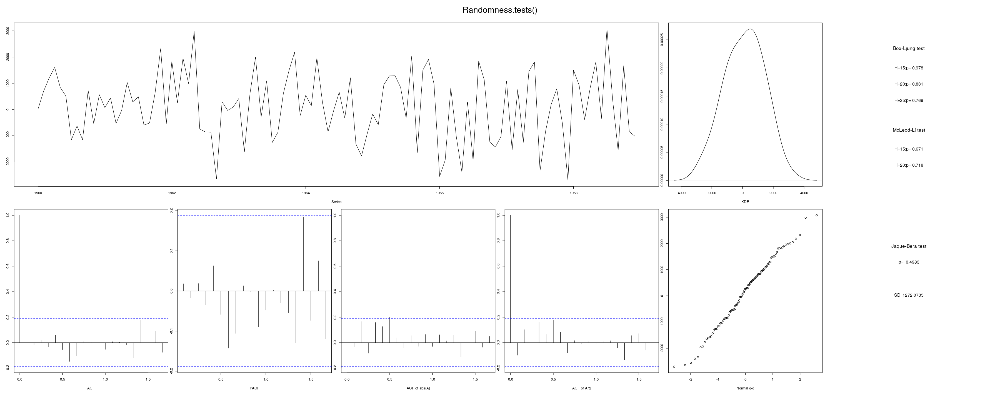

In [52]:
Randomness.tests(Fit24$residuals)

Residuals look good

Test the model

In [320]:
forecast1 <- forecast(Fit24, 12)
forecast1

         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       14099.30 12203.82 15994.79 11200.41 16998.19
Feb 1969       14273.99 12249.73 16298.26 11178.15 17369.84
Mar 1969       20651.84 18554.41 22749.27 17444.10 23859.58
Apr 1969       22581.10 20425.75 24736.45 19284.78 25877.42
May 1969       24469.29 22274.25 26664.32 21112.27 27826.30
Jun 1969       22811.84 20596.83 25026.84 19424.28 26199.39
Jul 1969       19733.74 17469.22 21998.27 16270.45 23197.04
Aug 1969       17324.11 15049.79 19598.42 13845.84 20802.37
Sep 1969       15913.27 13613.97 18212.58 12396.79 19429.75
Oct 1969       21223.19 18876.65 23569.73 17634.47 24811.91
Nov 1969       17540.79 15172.16 19909.42 13918.29 21163.29
Dec 1969       14319.78 11854.69 16784.87 10549.75 18089.82


Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  276.2425
  root Mean Squared Error:   1688.8452 




mean pred error,rMSE
276.2425,1688.845


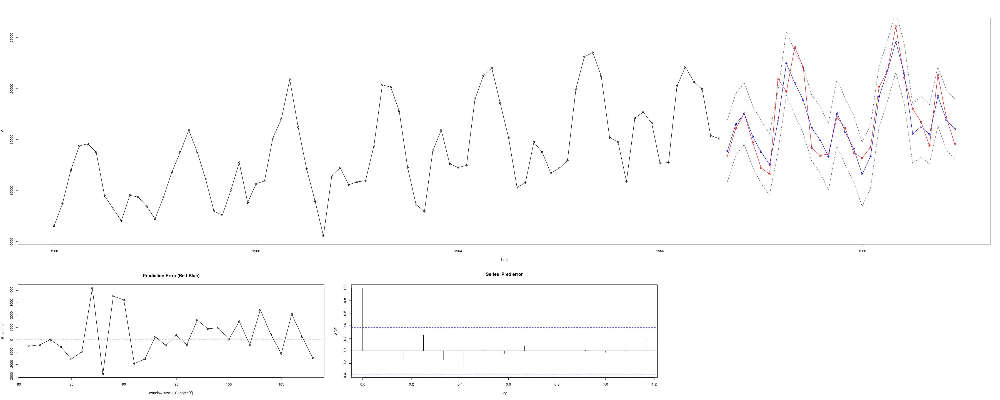

In [334]:
Y <- D1
window.size <- 80
Arima.order <- c(11,1,10)
pred.plot <- TRUE
include.mean = TRUE
include.drift = FALSE
lambda = NULL
xreg = FALSE
seasonal = c(1,0,0)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

This model is looking pretty good, however there are terms that have a NAN value.  What if we force them to 0?

In [360]:
Fit24 <- Arima(D1, order=c(11,1,7), seasonal=c(1,0,0), include.drift = FALSE, fixed=c(NA,NA,NA,0,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA))
Fit24

Series: D1 
ARIMA(11,1,7)(1,0,0)[12] 

Coefficients:
          ar1      ar2      ar3  ar4      ar5     ar6     ar7     ar8     ar9
      -0.4472  -0.3655  -0.4417    0  -0.4180  0.2006  0.3377  0.1293  0.0730
s.e.   0.1430   0.1184   0.1079    0   0.1271  0.1408  0.1236  0.1561  0.1498
         ar10    ar11      ma1     ma2     ma3      ma4     ma5      ma6
      -0.0543  0.3470  -0.0598  0.0727  0.2794  -0.4219  0.4138  -0.5804
s.e.   0.1431  0.1274   0.1667  0.1278  0.1293   0.0875  0.1204   0.1504
          ma7    sar1
      -0.5817  0.9049
s.e.   0.1587  0.0524

sigma^2 estimated as 2006037:  log likelihood=-933.59
AIC=1905.18   AICc=1913.91   BIC=1955.96

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.995,0.992,0.988,0.267,0.167,0.96,1272.46


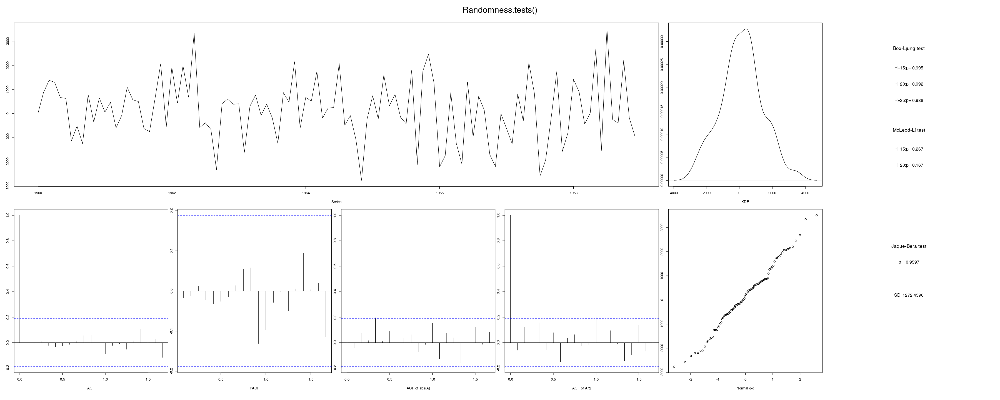

In [356]:
Randomness.tests(Fit24$residuals)

In [357]:
forecast1 <- forecast(Fit24, 12)
forecast1

Warning message in predict.Arima(object, n.ahead = h):
“MA part of model is not invertible”


         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       13950.92 12072.26 15829.58 11077.76 16824.09
Feb 1969       13888.52 11806.45 15970.59 10704.27 17072.77
Mar 1969       20437.39 18254.13 22620.65 17098.38 23776.40
Apr 1969       22867.45 20592.45 25142.44 19388.14 26346.75
May 1969       23398.43 21113.37 25683.50 19903.72 26893.15
Jun 1969       21769.54 19443.80 24095.28 18212.63 25326.45
Jul 1969       18977.16 16646.85 21307.47 15413.25 22541.07
Aug 1969       16292.05 13952.12 18631.99 12713.43 19870.67
Sep 1969       16132.49 13790.24 18474.73 12550.34 19714.63
Oct 1969       22234.96 19887.79 24582.12 18645.28 25824.63
Nov 1969       17570.62 15214.27 19926.98 13966.90 21174.35
Dec 1969       15365.34 12910.75 17819.92 11611.37 19119.30

### Try with a linear trend

In [323]:
Fit4 <- auto.arima(D1, d=0, D=0, xreg=time(D1), stepwise=FALSE, approximation=FALSE)
Fit4

Series: D1 
Regression with ARIMA(0,0,2)(1,0,0)[12] errors 

Coefficients:
         ma1     ma2    sar1   intercept      xreg
      0.2485  0.2320  0.8490  -1934919.3  992.2688
s.e.  0.1021  0.0896  0.0449    384276.4  195.6134

sigma^2 estimated as 2741019:  log likelihood=-958.9
AIC=1929.81   AICc=1930.64   BIC=1945.9

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.733,0.074,0.102,0.534,0.293,0.352,1624.147


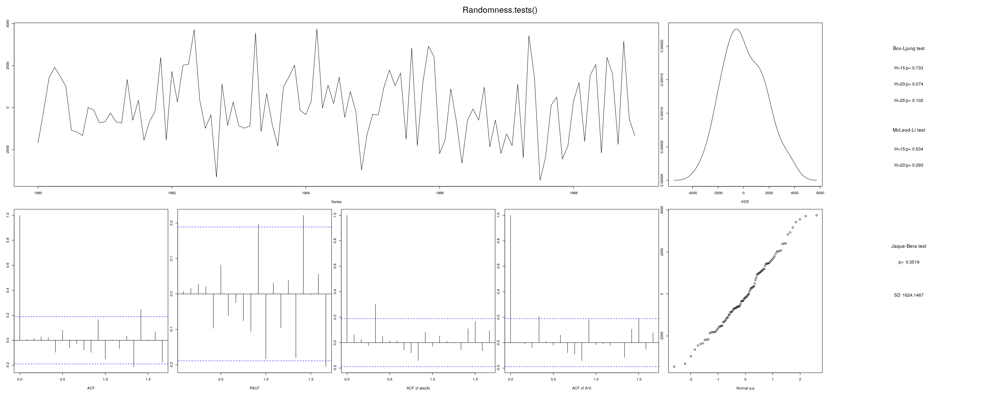

In [54]:
Randomness.tests(Fit4$resid)

Once again we have correlation at lag 11 and 17.

Test the model

In [324]:
h = 12
forecast2 <- forecast(Fit4, xreg=last(time(D1))+(1:h)/frequency(D1))
forecast2

         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       14444.86 12323.12 16566.60 11199.94 17689.78
Feb 1969       15490.78 13304.49 17677.06 12147.14 18834.41
Mar 1969       20812.88 18571.86 23053.90 17385.53 24240.23
Apr 1969       22171.81 19930.79 24412.83 18744.46 25599.16
May 1969       25897.62 23656.60 28138.64 22470.27 29324.97
Jun 1969       21652.61 19411.59 23893.63 18225.26 25079.96
Jul 1969       19067.30 16826.28 21308.33 15639.96 22494.65
Aug 1969       17974.46 15733.44 20215.48 14547.11 21401.81
Sep 1969       16002.95 13761.92 18243.97 12575.60 19430.29
Oct 1969       21921.60 19680.58 24162.62 18494.25 25348.95
Nov 1969       18400.75 16159.73 20641.77 14973.40 21828.10
Dec 1969       16203.41 13962.39 18444.44 12776.07 19630.76


Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  -489.9135
  root Mean Squared Error:   3284.415 




mean pred error,rMSE
-489.9135,3284.415


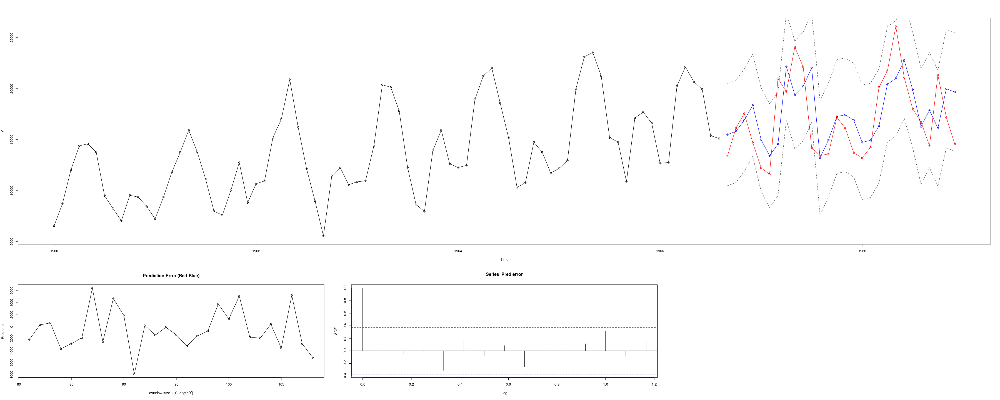

In [326]:
Y <- D1
window.size <- 80
Arima.order <- c(0,0,2)
pred.plot <- TRUE
include.mean = TRUE
include.drift = FALSE
lambda = NULL
xreg = TRUE
seasonal = c(1, 0, 0)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

Try forcing ar to 17 to get the correlation at lag 11 and lag 17

In [335]:
Fit4 <- Arima(D1, order=c(17,0,0), seasonal=c(1,0,0), include.drift = FALSE, xreg=time(D1))
Fit4

Series: D1 
Regression with ARIMA(17,0,0)(1,0,0)[12] errors 

Coefficients:
         ar1     ar2     ar3      ar4     ar5     ar6      ar7     ar8      ar9
      0.3651  0.0313  0.0925  -0.0787  0.0453  0.0362  -0.1805  0.1480  -0.1226
s.e.  0.0921  0.0945  0.1014   0.0995  0.0990  0.0921   0.0887  0.0954   0.0932
         ar10    ar11     ar12    ar13     ar14    ar15     ar16    ar17
      -0.0042  0.1900  -0.3688  0.0676  -0.0602  0.1642  -0.2446  0.3342
s.e.   0.0923  0.0927   0.0971  0.1001   0.1001  0.1084   0.1065  0.0986
        sar1   intercept       xreg
      0.9381  -1983798.8  1016.9825
s.e.  0.0290    402610.6   204.9422

sigma^2 estimated as 2159715:  log likelihood=-941.78
AIC=1925.56   AICc=1936.3   BIC=1981.88

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
1,0.996,0.997,0.345,0.339,0.97,1332.743


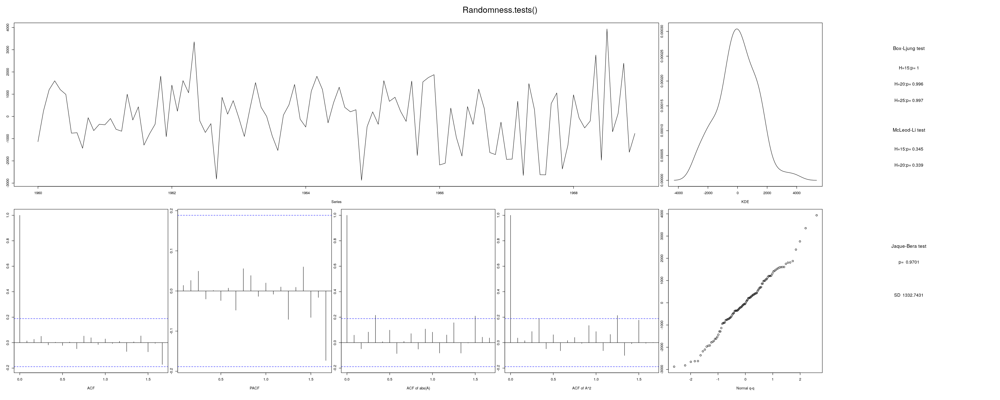

In [217]:
Randomness.tests(Fit4$resid)

The residuals look good, and the correlation at lag 11 and lag 17 is gone.

Test the model

In [336]:
h = 12
forecast2 <- forecast(Fit4, xreg=last(time(D1))+(1:h)/frequency(D1))
forecast2

         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       14940.54 13057.17 16823.90 12060.18 17820.89
Feb 1969       13113.61 11108.66 15118.55 10047.31 16179.90
Mar 1969       21641.68 19612.92 23670.44 18538.96 24744.40
Apr 1969       22235.97 20183.82 24288.12 19097.48 25374.46
May 1969       24259.98 22207.48 26312.47 21120.96 27399.00
Jun 1969       22288.82 20234.63 24343.01 19147.21 25430.43
Jul 1969       18875.80 16817.16 20934.43 15727.39 22024.20
Aug 1969       16233.26 14157.00 18309.51 13057.90 19408.61
Sep 1969       16331.66 14253.45 18409.88 13153.31 19510.01
Oct 1969       21718.36 19635.31 23801.41 18532.62 24904.10
Nov 1969       17656.20 15565.26 19747.15 14458.38 20854.02
Dec 1969       16446.71 14330.84 18562.59 13210.76 19682.66

In [337]:
Y <- D1
window.size <- 80
Arima.order <- c(17,0,0)
pred.plot <- TRUE
include.mean = TRUE
include.drift = FALSE
lambda = NULL
xreg = TRUE
seasonal = c(1, 0, 0)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

    i= 1   MLE-CSS failed.  Using CSS.
    i= 2   MLE-CSS failed.  Using CSS.
    i= 3   MLE-CSS failed.  Using CSS.
    i= 6   MLE-CSS failed.  Using CSS.
    i= 7   MLE-CSS failed.  Using CSS.
    i= 8   MLE-CSS failed.  Using CSS.
    i= 9   MLE-CSS failed.  Using CSS.
    i= 10   MLE-CSS failed.  Using CSS.
    i= 11   MLE-CSS failed.  Using CSS.
    i= 12   MLE-CSS failed.  Using CSS.
    i= 13   MLE-CSS failed.  Using CSS.
    i= 14   MLE-CSS failed.  Using CSS.
    i= 15   MLE-CSS failed.  Using CSS.
    i= 16   MLE-CSS failed.  Using CSS.


ERROR: Error in solve.default(res$hessian * n.used): system is computationally singular: reciprocal condition number = 1.03202e-16


Test unable to run

In [ ]:
We have a lot of AR terms that are not significant.  What if we force them to 0.

In [251]:
Fit4 <- Arima(D1, order=c(17,0,0), seasonal=c(1,0,0), include.drift = FALSE, xreg=time(D1), fixed = c(NA,0,0,0,0,NA,NA,0,0,0,NA,NA,0,0,0,0,NA,NA,NA,NA))
Fit4

Series: D1 
Regression with ARIMA(17,0,0)(1,0,0)[12] errors 

Coefficients:
         ar1  ar2  ar3  ar4  ar5     ar6      ar7  ar8  ar9  ar10    ar11
      0.3206    0    0    0    0  0.0878  -0.1742    0    0     0  0.2232
s.e.  0.0823    0    0    0    0  0.0865   0.0845    0    0     0  0.0871
         ar12  ar13  ar14  ar15  ar16    ar17    sar1  intercept       xreg
      -0.3932     0     0     0     0  0.2789  0.9352   -1985369  1017.7993
s.e.   0.0894     0     0     0     0  0.0869  0.0260     374333   190.5483

sigma^2 estimated as 2146174:  log likelihood=-947.05
AIC=1914.09   AICc=1916.36   BIC=1940.92

  B-L test H0: the series is uncorrelated
  M-L test H0: the square of the series is uncorrelated
  J-B test H0: the series came from Normal distribution
  SD         : Standard Deviation of the series



BL15,BL20,BL25,ML15,ML20,JB,SD
0.998,0.931,0.911,0.072,0.036,0.844,1409.144


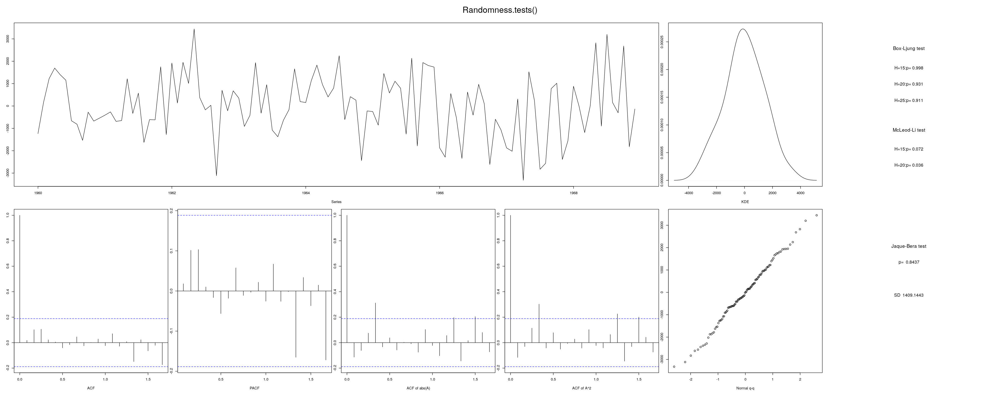

In [252]:
Randomness.tests(Fit4$resid)

The McLoed-Li test p-values are marginally ok, the rest of the residuals still look OK.  The AICc is down.

## Evaluate Possible models

### Summary of possible models

<table>
  <tr>
    <th></th>
    <th>Model</th>
      <th>Sigma^2</th>
      <th>AICc</th>
      <th>BL</th>
      <th>ML</th>
      <th>JB</th>
      <th>ACF/PACF</th>
      <th>95% CI</th>
      <th>rMSE</th>
      <th>sigma</th>
  </tr>
    <tr>
        <td>1</td>
        <td>ARIMA(12,1,0) with drift</td>
        <td>2,455,321</td>
        <td>1,909.45</td>
        <td>Good</td>
        <td>Good</td>
        <td>Good</td>
        <td>Correlation</td>
        <td>10,645.63 to 16,787.95</td>
        <td>1,827.521</td>
        <td>1,566.95</td>
    </tr>
    <tr>
        <td>2</td>
        <td>ARIMA(17,1,0) with drift</td>
        <td>2,014,661</td>
        <td>NA</td>
        <td>Good</td>
        <td>Good</td>
        <td>Good</td>
        <td>No Correlation</td>
        <td>10,631.09 to 16,194.99</td>
        <td>1,911.676</td>
        <td>1,419.39</td>
    </tr>
    <tr>
        <td>4</td>
        <td>Regression with ARIMA(12,0,0)</td>
        <td>2,500,814</td>
        <td>1928.67</td>
        <td>Good</td>
        <td>Good</td>
        <td>Good</td>
        <td>Correlation</td>
        <td>10,629.36 to 16,828.32</td>
        <td>1,906.336</td>
        <td>1,581.40</td>
    </tr>
    <tr>
        <td>5</td>
        <td>Regression with ARIMA(17,0,0)</td>
        <td>2,005,910</td>
        <td>NA</td>
        <td>Good</td>
        <td>Good</td>
        <td>Good</td>
        <td>No Correlation</td>
        <td>10,305.36 to 15,857.16</td>
        <td>1906.336</td>
        <td>1,415.30</td>
    </tr>
    <tr>
        <td>6</td>
        <td>ARIMA(2,0,0)(0,1,2)[12] with drift</td>
        <td>2,159,951</td>
        <td>1691.04</td>
        <td>Good</td>
        <td>Marginal</td>
        <td>Good</td>
        <td>Correlation</td>
        <td>11,893 to 17,691.20</td>
        <td>3,419.135</td>
        <td>1,469.68</td>
    </tr>
    <tr>
        <td>7</td>
        <td>ARIMA(11,0,10)(0,1,1)[12] with drift</td>
        <td>1,754,542</td>
        <td>1714.22</td>
        <td>Good</td>
        <td>Good</td>
        <td>Good</td>
        <td>No Correlation</td>
        <td>11,349.53 to 16,747.61</td>
        <td>2,142.48</td>
        <td>1,324.59</td>
    </tr>
    <tr>
        <td>8</td>
        <td>ARIMA(2,1,1)(1,0,0)[12]</td>
        <td>2,810,698</td>
        <td>1917.04</td>
        <td>Marginal</td>
        <td>Good</td>
        <td>Good</td>
        <td>Correlation</td>
        <td>11,101.17 to 17,673.02</td>
        <td>3,435.95</td>
        <td>1676.51</td>
    </tr>
    <tr>
        <td>9</td>
        <td>ARIMA(11,1,10)(1,0,0)[12]</td>
        <td>2,058,793</td>
        <td>1929.95</td>
        <td>Good</td>
        <td>Good</td>
        <td>Good</td>
        <td>No Correlation</td>
        <td>11,200.41 to 16,998.19</td>
        <td>1,688.845</td>
        <td>1,434.85</td>
    </tr>
    <tr>
        <td>10</td>
        <td>Regression with ARIMA(0,0,2)(1,0,0)[12]</td>
        <td>2,741,019</td>
        <td>1930.64</td>
        <td>Good</td>
        <td>Good</td>
        <td>Good</td>
        <td>Correlation</td>
        <td>11,199.94 to 17,689.78</td>
        <td>3284.415</td>
        <td>1,655.60</td>
    </tr>
</table>

The two models we will choose to evaluate are ARIMA(11,0,10)(0,1,1)[12] with drift and ARIMA(2,0,0)(0,1,2)[12] with drift

### Model ARIMA(11,0,10)(0,1,1)[12] with drift

In [130]:
FitE1 <- Arima(D1, order=c(11,0,10), seasonal=c(0,1,1), include.drift = TRUE)
FitE1

Series: D1 
ARIMA(11,0,10)(0,1,1)[12] with drift 

Coefficients:
          ar1     ar2     ar3     ar4      ar5     ar6      ar7      ar8
      -0.0995  0.2325  0.4988  0.4941  -0.3049  0.4003  -0.0663  -0.2292
s.e.   0.1035  0.1219  0.1067  0.1138   0.1836  0.1607   0.1233   0.1279
          ar9     ar10    ar11     ma1      ma2      ma3      ma4     ma5
      -0.3386  -0.5380  0.5267  0.4958  -0.0175  -0.4389  -0.5577  0.2079
s.e.   0.1066   0.0852  0.1024  0.1155   0.1519   0.1433   0.1386  0.2015
          ma6      ma7      ma8     ma9    ma10     sma1    drift
      -0.5621  -0.4392  -0.0096  0.4971  0.9900  -0.4451  84.4929
s.e.   0.1571   0.1400   0.1483  0.1204  0.1342   0.1566  16.1492

sigma^2 estimated as 1754542:  log likelihood=-824.66
AIC=1697.32   AICc=1714.22   BIC=1758.86

In [131]:
forecast1 <- forecast(FitE1, 12)
forecast1

         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       14048.57 12283.76 15813.38 11349.53 16747.61
Feb 1969       14822.91 12929.09 16716.74 11926.56 17719.27
Mar 1969       21346.69 19427.71 23265.67 18411.87 24281.52
Apr 1969       23179.37 21245.53 25113.21 20221.82 26136.92
May 1969       25672.33 23717.42 27627.25 22682.55 28662.12
Jun 1969       22809.58 20825.93 24793.23 19775.85 25843.31
Jul 1969       20249.12 18262.34 22235.90 17210.61 23287.63
Aug 1969       16893.72 14884.40 18903.04 13820.73 19966.71
Sep 1969       16070.98 14059.41 18082.55 12994.55 19147.41
Oct 1969       21663.98 19650.80 23677.16 18585.09 24742.87
Nov 1969       19105.70 17089.33 21122.07 16021.93 22189.47
Dec 1969       15899.94 13850.88 17949.00 12766.17 19033.70

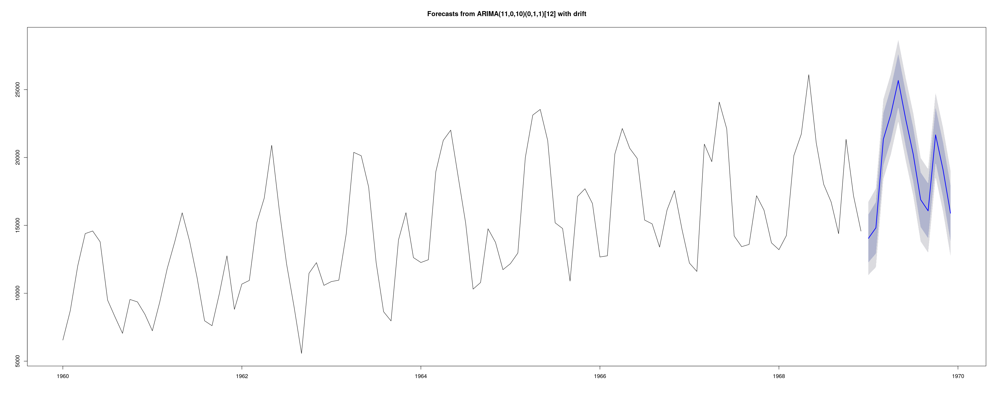

In [132]:
plot(forecast1)

The 95% CI for the next observation is 11,349.53 to 16,747.61


Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  -1298.3016
  root Mean Squared Error:   2631.846 




mean pred error,rMSE
-1298.302,2631.846


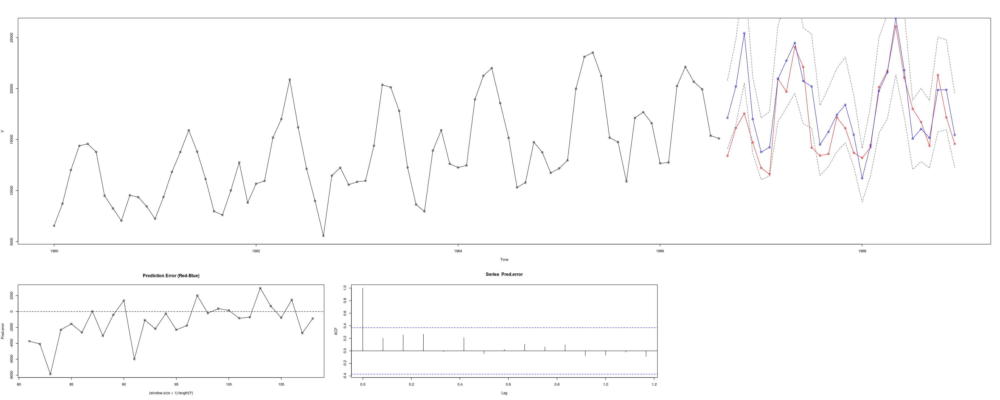

In [133]:
Y <- D1
window.size <- 80
Arima.order <- c(11,0,10)
pred.plot <- TRUE
include.mean = TRUE
include.drift = TRUE
lambda = FALSE
xreg = FALSE
seasonal = c(0,1,1)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

### Model ARIMA(2,0,0)(0,1,2)[12] with drift

In [134]:
FitE2 <- Arima(D1, order=c(2,0,0), seasonal=c(0,1,2), include.drift = TRUE)
FitE2

Series: D1 
ARIMA(2,0,0)(0,1,2)[12] with drift 

Coefficients:
         ar1     ar2     sma1     sma2    drift
      0.2088  0.1965  -0.5695  -0.2326  83.3338
s.e.  0.1001  0.1009   0.1715   0.1591   8.9502

sigma^2 estimated as 2159951:  log likelihood=-839.05
AIC=1690.09   AICc=1691.04   BIC=1705.48

In [135]:
forecast2 <- forecast(FitE2, 12)
forecast2

         Point Forecast    Lo 80    Hi 80    Lo 95    Hi 95
Jan 1969       14792.12 12896.51 16687.72 11893.04 17691.20
Feb 1969       15749.16 13812.87 17685.45 12787.86 18710.46
Mar 1969       21623.48 19634.71 23612.26 18581.91 24665.06
Apr 1969       23806.78 21810.55 25803.02 20753.81 26859.76
May 1969       26190.34 24190.19 28190.50 23131.37 29249.31
Jun 1969       22781.96 20780.91 24783.01 19721.62 25842.31
Jul 1969       18888.63 16887.23 20890.02 15827.76 21949.50
Aug 1969       17156.29 15154.80 19157.78 14095.28 20217.30
Sep 1969       15286.28 13284.78 17287.79 12225.24 18347.32
Oct 1969       20673.31 18671.82 22674.79 17612.29 23734.32
Nov 1969       19254.14 17252.83 21255.44 16193.41 22314.87
Dec 1969       16861.71 14860.54 18862.87 13801.19 19922.22

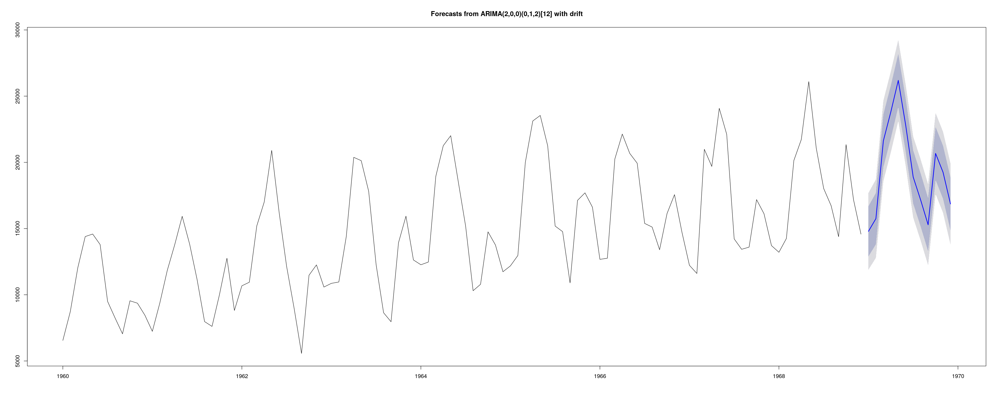

In [136]:
plot(forecast2)

The 95% CI for the next observation is 11,893.04 to 17,691.20


Last  28  obs fit retrospectively
    with Rolling 1-step prediction
  Average prediction error:  -730.574
  root Mean Squared Error:   3470.825 




mean pred error,rMSE
-730.574,3470.825


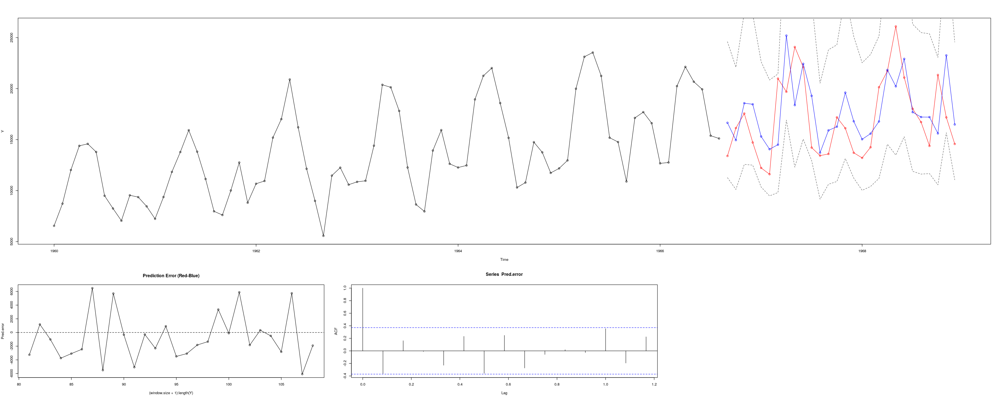

In [138]:
Y <- D1
window.size <- 80
Arima.order <- c(2,0,0)
pred.plot <- TRUE
include.mean = TRUE
include.drift = TRUE
lambda = FALSE
xreg = FALSE
seasonal = c(0,1,2)

Rolling1step.forecast(Y, window.size, Arima.order, pred.plot, include.mean, include.drift, lambda, xreg, seasonal)

## Conclusion

The ARIMA(11,0,10)(0,1,1)[12] with drift model has the smallest 95% CI and the smallest rMSE.